In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons
from sklearn.datasets import make_circles
from sklearn.metrics import confusion_matrix,classification_report

# linear dataset

In [2]:
np.random.seed(42)

In [3]:
X,y = make_blobs(n_samples=10000,centers=4,n_features=10,random_state=42)
X = X + np.random.normal(scale=5,size=X.shape)

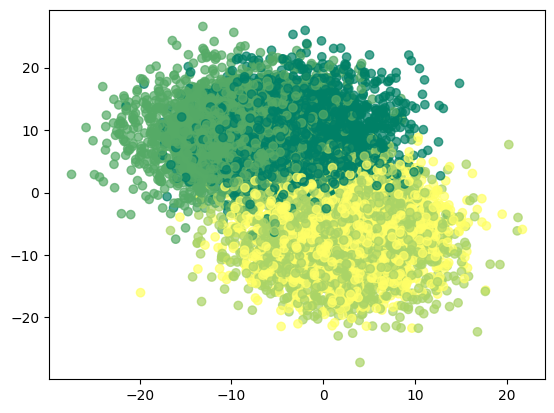

In [4]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='summer',alpha=0.7)
plt.show()

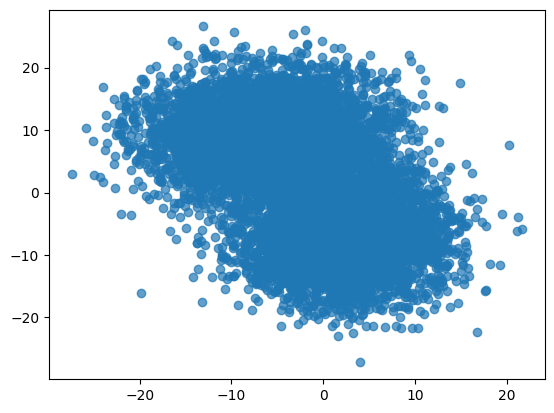

In [5]:
plt.scatter(X[:,0],X[:,1],alpha=0.7)
plt.show()

In [6]:
X.shape

(10000, 10)

In [7]:
df_linear = pd.DataFrame(X) 

In [8]:
df_linear.columns = [f"vab_{col+1}" for col in df_linear.columns]

In [9]:
df_linear['target'] = y

In [10]:
df_linear

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1


In [11]:
df_linear['target'].value_counts()

target
0    2500
1    2500
2    2500
3    2500
Name: count, dtype: int64

In [12]:
# sns.pairplot(df_linear)

<Axes: ylabel='Density'>

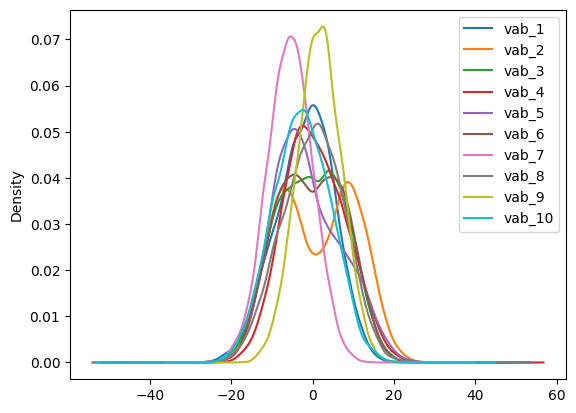

In [13]:
df_linear.iloc[:,:-1].plot(kind='density')

### correlation matrix

In [14]:
df_linear.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10
vab_1,1.000000,-0.488534,-0.470998,0.320838,0.381234,0.449414,-0.014063,-0.208794,0.195200,-0.065392
vab_2,-0.488534,1.000000,0.633521,-0.268397,-0.536040,-0.653314,-0.113730,0.432828,-0.165487,0.324225
vab_3,-0.470998,0.633521,1.000000,-0.397138,-0.572686,-0.577367,-0.106984,0.434678,-0.193766,0.160497
vab_4,0.320838,-0.268397,-0.397138,1.000000,0.450400,0.266201,0.003648,-0.276552,0.229349,0.259092
vab_5,0.381234,-0.536040,-0.572686,0.450400,1.000000,0.517488,0.161766,-0.526338,0.175716,-0.072649
vab_6,0.449414,-0.653314,-0.577367,0.266201,0.517488,1.000000,0.115875,-0.418888,0.167854,-0.287759
vab_7,-0.014063,-0.113730,-0.106984,0.003648,0.161766,0.115875,1.000000,-0.242045,-0.039498,-0.145081
vab_8,-0.208794,0.432828,0.434678,-0.276552,-0.526338,-0.418888,-0.242045,1.000000,-0.078536,0.171056
vab_9,0.195200,-0.165487,-0.193766,0.229349,0.175716,0.167854,-0.039498,-0.078536,1.000000,0.069508
vab_10,-0.065392,0.324225,0.160497,0.259092,-0.072649,-0.287759,-0.145081,0.171056,0.069508,1.000000


<Axes: >

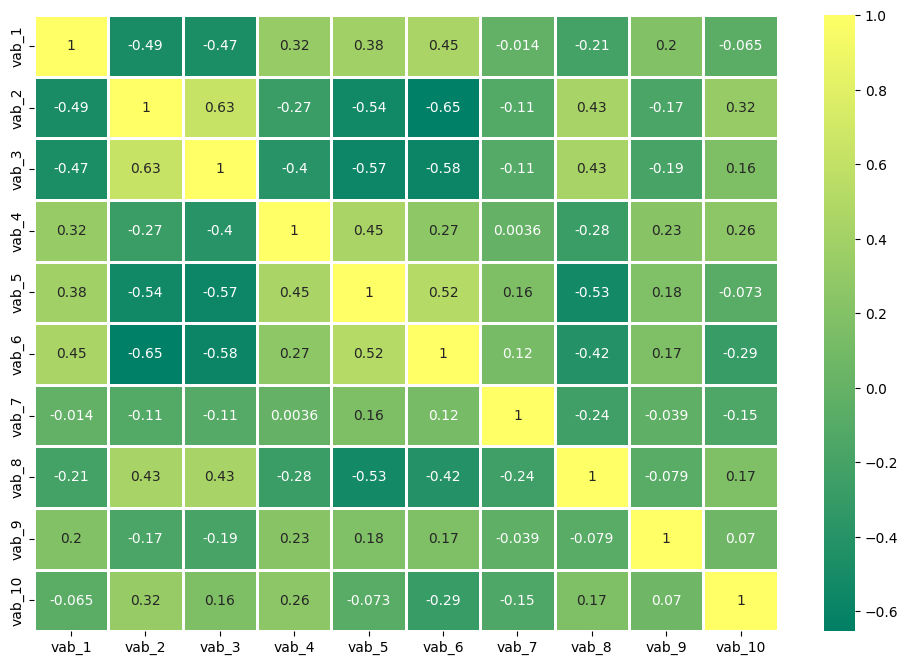

In [15]:
plt.figure(figsize=(12,8))
sns.heatmap(df_linear.iloc[:,:-1].corr(),cmap='summer',annot=True,linecolor='white',linewidths=1)

### data standardization

In [16]:
X_values = df_linear.iloc[:,:-1].values

In [17]:
y_values = df_linear.iloc[:,-1].values

In [18]:
from sklearn.preprocessing import StandardScaler

In [19]:
scaler = StandardScaler()

In [20]:
X_values = scaler.fit_transform(X_values)

In [21]:
np.mean(X_values),np.std(X_values)

(5.771738642579294e-16, 1.0)

In [22]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9
0,0.337989,0.852415,0.917396,1.094744,-0.832091,-1.146646,0.789945,1.522091,-0.018035,1.409533
1,-1.366848,0.657049,1.113748,-2.346504,-1.860820,-1.009062,-0.543889,0.170152,-1.316055,-1.433391
2,0.007181,0.688818,0.949157,-1.897141,-0.850240,-0.521131,-0.723540,0.494068,-1.068807,-0.302389
3,0.220956,0.001378,-0.478742,-0.998674,0.592971,-0.070395,0.265891,-1.495566,-1.141406,-0.837715
4,0.284741,0.881299,0.697712,0.001877,-1.304942,-1.208914,-0.962620,1.640478,0.429891,-0.314783
...,...,...,...,...,...,...,...,...,...,...
9995,-0.730062,0.483411,0.717047,-1.746965,-0.498253,-1.773487,-0.513950,0.090961,0.265474,-0.490137
9996,1.779499,-0.721956,-1.266293,1.824237,1.683855,1.018182,1.547613,-1.230246,1.027113,-0.117127
9997,-0.322608,0.217572,0.752464,0.915137,-0.774488,-0.867764,-2.941722,1.282482,-1.017431,1.754374
9998,-0.485479,0.495851,0.544921,0.080956,-0.123043,-0.367439,-0.190973,-1.056320,0.450268,-0.528810


## pca application

In [23]:
from sklearn.decomposition import PCA

In [24]:
pca_general = PCA()

In [25]:
pca_general.fit(X_values)

PCA()

In [26]:
explained_variance = pca_general.explained_variance_ratio_

In [27]:
explained_variance

array([0.38520707, 0.14588222, 0.1069863 , 0.08547884, 0.06909187,
       0.04945603, 0.04598146, 0.04032378, 0.03945173, 0.0321407 ])

In [28]:
eigenvalues = pca_general.explained_variance_

In [29]:
pd.DataFrame(eigenvalues)

,0
0,3.852456
1,1.458968
2,1.069970
3,0.854874
4,0.690988
5,0.494610
6,0.459861
7,0.403278
8,0.394557
9,0.321439


In [30]:
eigenvectors = pca_general.components_

### scree plot

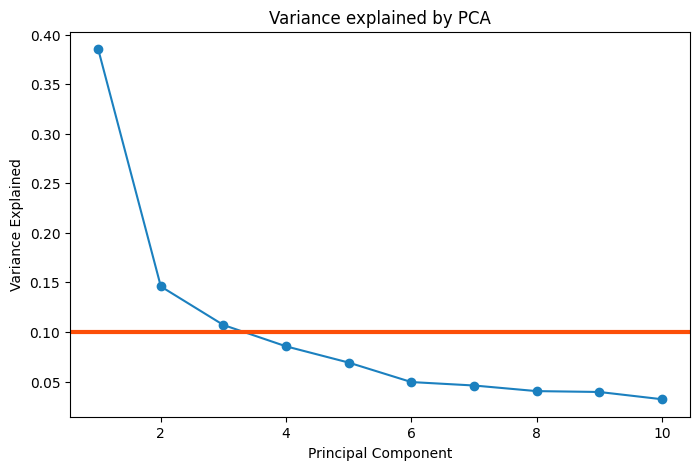

In [31]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [32]:
pca = PCA(n_components=2)

In [ ]:
principal_components = pca.fit_transform(X_values)

In [34]:
pd.DataFrame(principal_components).head(8)

,0,1
0,1.729149,1.630145
1,3.079652,-2.503369
2,2.091626,-1.119527
3,-0.667196,-1.640007
4,2.106295,0.731962
5,0.894275,2.147922
6,1.212345,0.518357
7,1.673561,0.895672


In [35]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [36]:
final_df = pd.concat([principal_df,df_linear[['target']]],axis = 1)

In [37]:
final_df

,principal component 1,principal component 2,target
0,1.729149,1.630145,0
1,3.079652,-2.503369,1
2,2.091626,-1.119527,1
3,-0.667196,-1.640007,2
4,2.106295,0.731962,0
...,...,...,...
9995,2.094377,-0.760440,1
9996,-3.701352,0.692351,3
9997,2.017119,2.435375,0
9998,0.303674,-0.196164,1


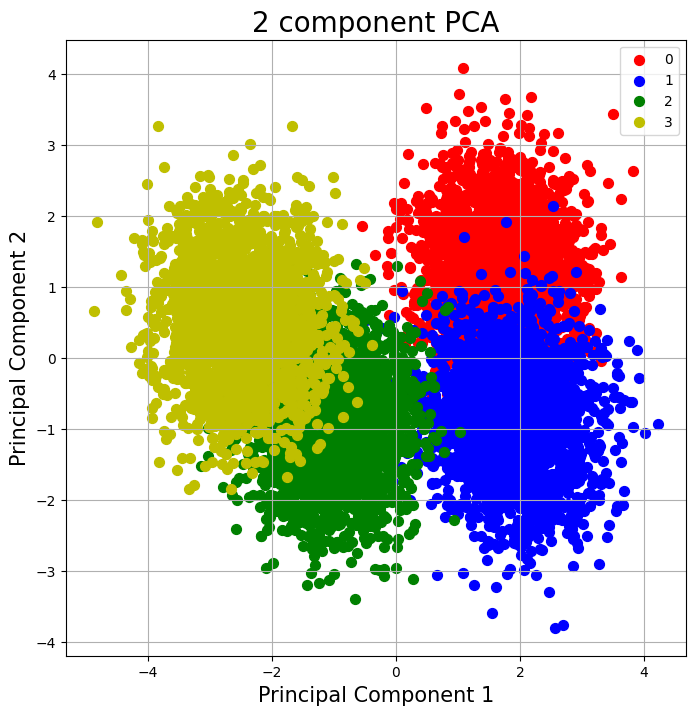

In [38]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### biplot

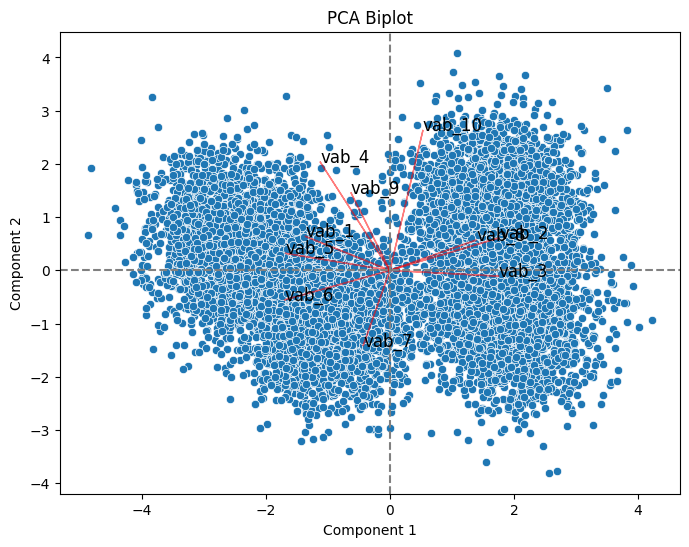

In [39]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(df_linear.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

### loading plot

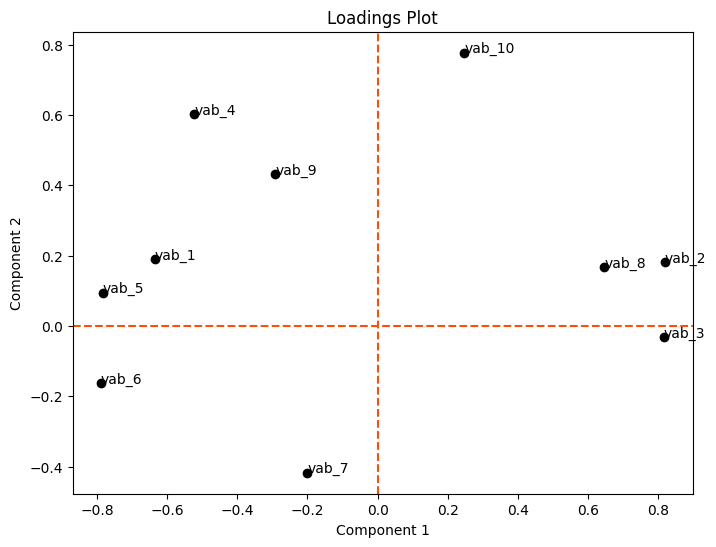

In [40]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(df_linear.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

### scores

In [41]:
scores_pca = pca.transform(X_values)

In [42]:
pd.DataFrame(scores_pca).head()

,0,1
0,1.729149,1.630145
1,3.079652,-2.503369
2,2.091626,-1.119527
3,-0.667196,-1.640007
4,2.106295,0.731962


## t-SNE

In [43]:
from sklearn.manifold import TSNE

In [44]:
tsne = TSNE(n_components=2,random_state=42)

In [45]:
X_tsne = tsne.fit_transform(X_values)

In [46]:
tsne_data = np.vstack((X_tsne.T,df_linear['target'])).T

In [47]:
tsne_df = pd.DataFrame(data=tsne_data,columns=('dim_1','dim_2','target'))

In [48]:
tsne_df

,dim_1,dim_2,target
0,38.644676,18.503998,0.0
1,56.399731,-42.135387,1.0
2,54.096004,-39.530647,1.0
3,0.297695,-20.319942,2.0
4,22.790623,29.480310,0.0
...,...,...,...
9995,42.492203,-18.438784,1.0
9996,-85.829155,-4.425604,3.0
9997,55.203342,46.151909,0.0
9998,27.813879,-16.238089,1.0


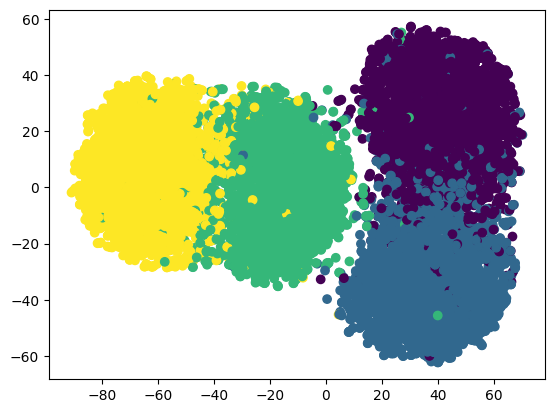

In [49]:
plt.scatter(x=tsne_df['dim_1'],y=tsne_df['dim_2'],c=tsne_df['target'])
plt.show()

In [50]:
tsne.kl_divergence_

2.693162202835083

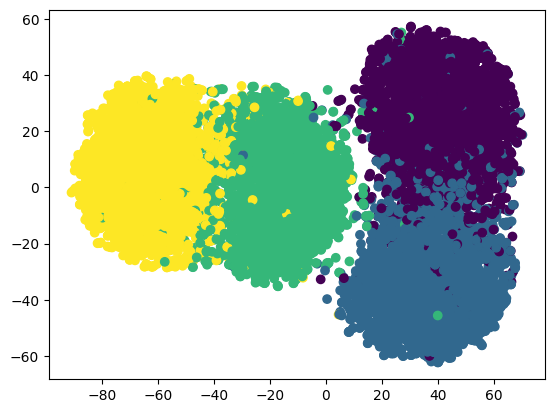

In [51]:
plt.scatter(x=X_tsne[:,0],y=X_tsne[:,1],c=y)
plt.show()

## clustering 

In [52]:
from sklearn.cluster import KMeans

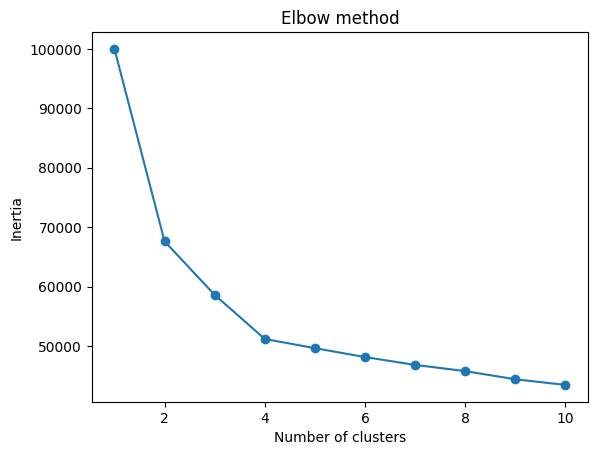

In [53]:
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_values)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [54]:
kmeans = KMeans(n_clusters=4,init='k-means++',random_state=42)

In [55]:
kmeans.fit(X_values)

KMeans(n_clusters=4, random_state=42)

In [56]:
df_linear['k_means'] = kmeans.labels_

In [57]:
df_linear

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0,1
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1,2
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1,2
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2,0
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1,2
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3,3
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0,1
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1,2


In [58]:
from scipy.optimize import linear_sum_assignment

y_true = df_linear['target'].values  
y_kmeans = df_linear['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_linear['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_linear['k_means'] == y_true))

accuracy before: 0.2584
accuracy after: 0.9515


In [59]:
df_linear

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0,0
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1,1
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1,1
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2,2
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1,1
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3,3
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0,0
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1,1


In [60]:
print(np.unique(df_linear['target']))

[0 1 2 3]


In [61]:
print(np.unique(kmeans.labels_))

[0 1 2 3]


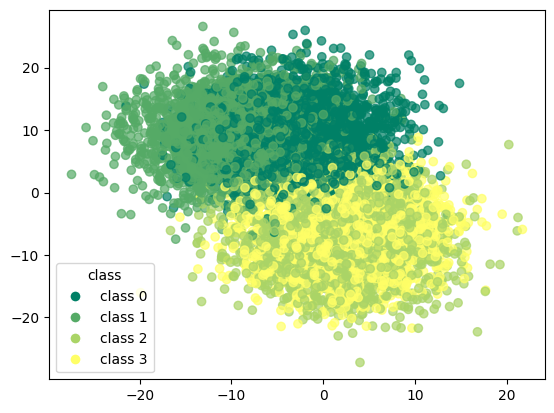

In [62]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_linear.iloc[:, 0], df_linear.iloc[:, 1], 
                      c=df_linear['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_linear['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

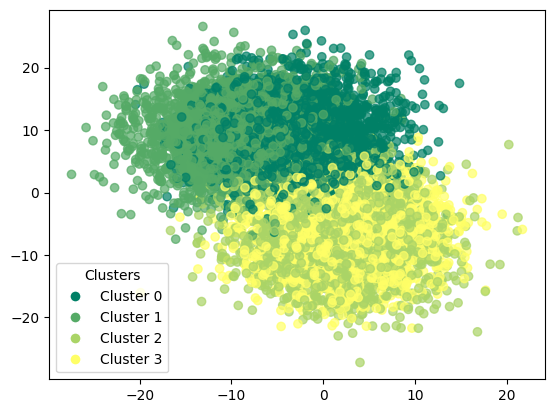

In [63]:
scatter = plt.scatter(df_linear.iloc[:, 0], df_linear.iloc[:, 1], 
                      c=df_linear['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_linear['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [64]:
kmeans.cluster_centers_

array([[ 0.56558805, -0.87556251, -0.46635603, -0.44974329,  0.03063016,
         0.74416537, -0.06389666,  0.04700013,  0.01948013, -0.95466199],
       [-0.09446272,  0.83630486,  0.6112746 ,  0.16539521, -0.6895562 ,
        -0.80098967, -0.66071156,  0.97413655,  0.17236147,  0.98322217],
       [-1.07694732,  0.85741395,  0.88517042, -0.83684639, -0.61579106,
        -0.74883097,  0.36595875,  0.07572473, -0.58459268, -0.23813783],
       [ 0.60068949, -0.81354359, -1.02396472,  1.11345688,  1.2679872 ,
         0.80126734,  0.35857385, -1.09258202,  0.38927771,  0.20645092]])

In [65]:
print(confusion_matrix(df_linear['target'],df_linear['k_means']))

[[2344  150    5    1]
 [ 146 2338   15    1]
 [  10    5 2405   80]
 [   0    0   72 2428]]


In [66]:
print(classification_report(df_linear['target'],df_linear['k_means']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      2500
           1       0.94      0.94      0.94      2500
           2       0.96      0.96      0.96      2500
           3       0.97      0.97      0.97      2500

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000



### clustering with pca

In [ ]:
WCSS = []

for i in range(1,30):
  kmeans_pca = KMeans(n_clusters = i,init = "k-means++",random_state=42)
  kmeans_pca.fit(scores_pca)
  WCSS.append(kmeans_pca.inertia_)

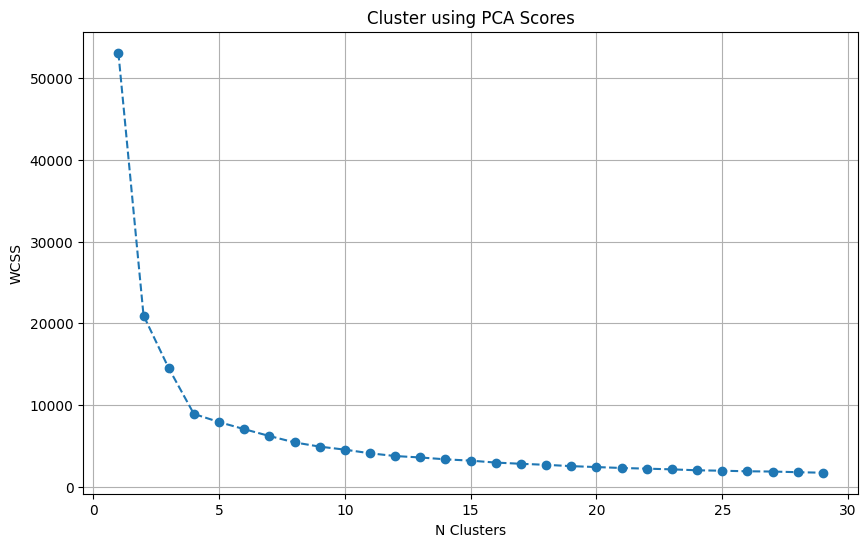

In [68]:
plt.figure(figsize = (10,6))
plt.plot(range(1,30), WCSS, marker = "o",linestyle = "--")
plt.grid()
plt.title("Cluster using PCA Scores")
plt.ylabel("WCSS")
plt.xlabel("N Clusters")
plt.show()

In [69]:
kmeans_pca = KMeans(n_clusters=4,init='k-means++',random_state=42)

In [70]:
kmeans_pca.fit(scores_pca)

KMeans(n_clusters=4, random_state=42)

In [71]:
df_pca_kmeans = df_linear.copy()

In [72]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [73]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_pca
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0,0,3
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1,1,1
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1,1,1
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2,2,2
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1,1,1
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3,3,0
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0,0,3
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1,1,2


In [74]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.4536
accuracy after: 0.9121


In [75]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_pca
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0,0,0
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1,1,1
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1,1,1
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2,2,2
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1,1,1
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3,3,3
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0,0,0
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1,1,2


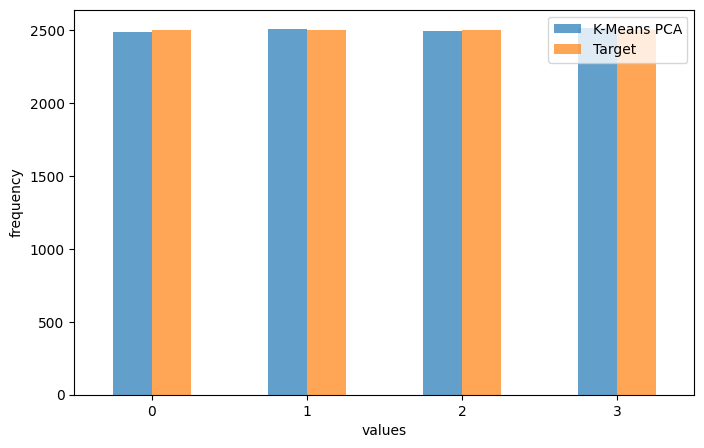

In [76]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [77]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2278  215    7    0]
 [ 194 2273   33    0]
 [  13   17 2263  207]
 [   0    0  193 2307]]


In [78]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      2500
           1       0.91      0.91      0.91      2500
           2       0.91      0.91      0.91      2500
           3       0.92      0.92      0.92      2500

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



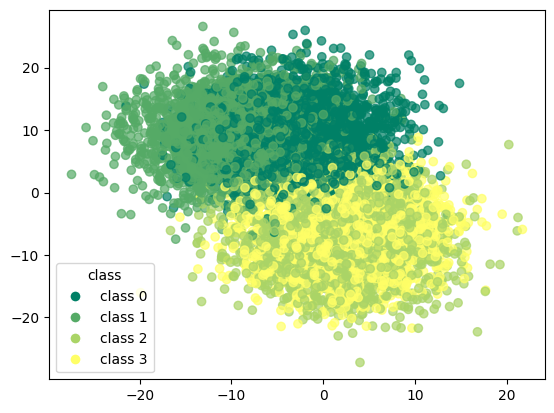

In [79]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

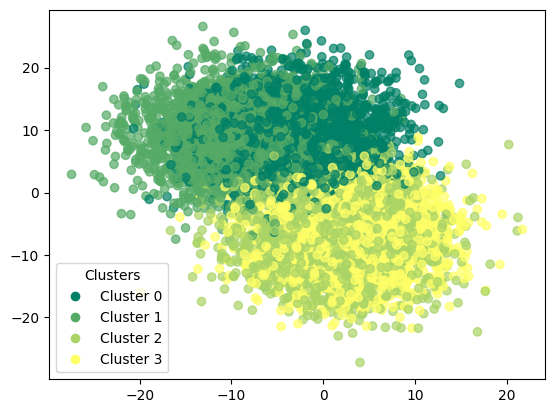

In [80]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

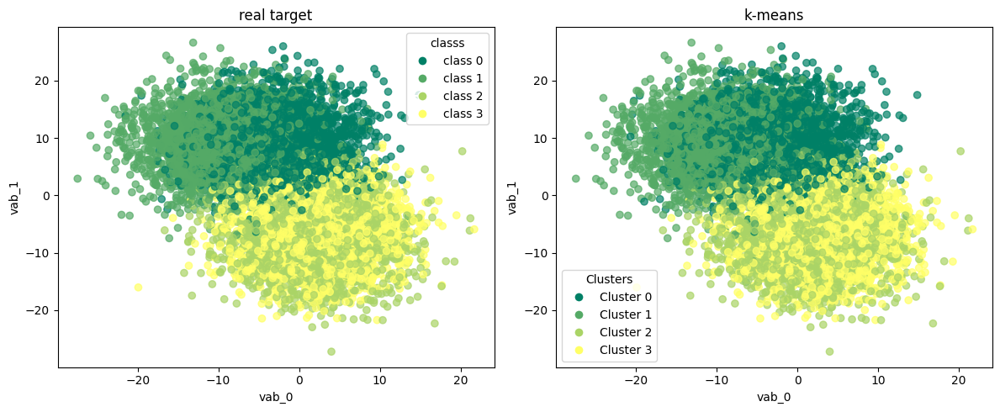

In [81]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

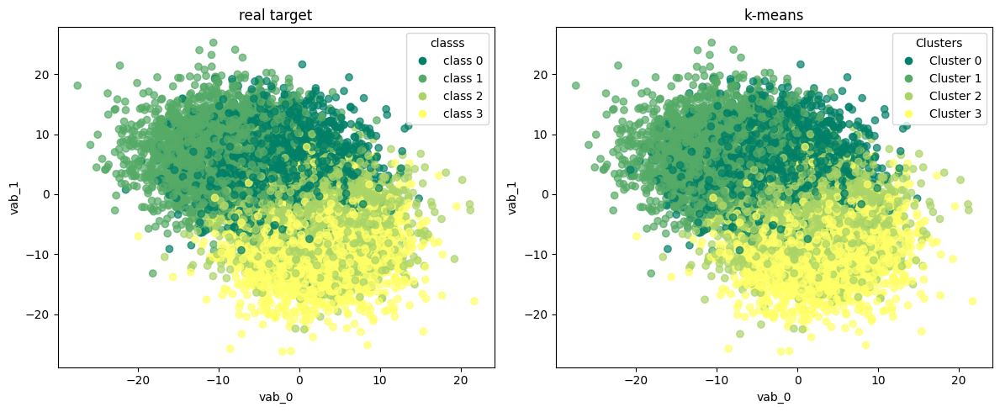

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

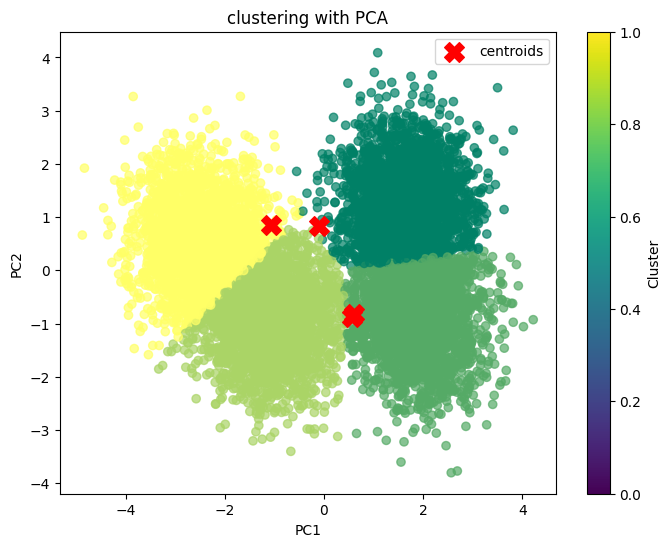

In [83]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

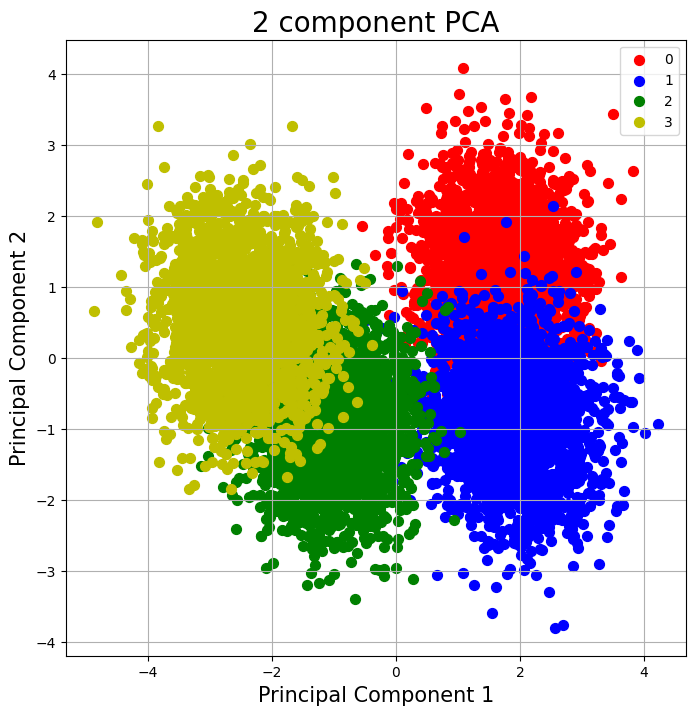

In [84]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### clustering with t-SNE

In [85]:
kmeans_tsne = KMeans(n_clusters=4,init='k-means++',random_state=42)

In [86]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=4, random_state=42)

In [87]:
df_tsne_kmeans = df_linear.copy()

In [88]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [89]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_tsne
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0,0,2
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1,1,1
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1,1,1
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2,2,0
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1,1,1
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3,3,3
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0,0,2
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1,1,1


In [90]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.4723
accuracy after: 0.9374


In [91]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_tsne
0,0.467491,9.278825,7.068561,8.782917,-8.030122,-9.583016,-1.212004,11.413573,1.459564,7.276970,0,0,0
1,-11.592235,7.412776,8.671865,-16.954165,-16.564488,-8.471637,-8.622948,1.290722,-5.536911,-12.644896,1,1,1
2,-1.872588,7.716225,7.327901,-13.593380,-8.180689,-4.530203,-9.621116,3.716095,-4.204219,-4.719373,1,1,1
3,-0.360377,1.150108,-4.331577,-6.873749,3.792235,-0.889219,-4.123714,-11.181592,-4.595532,-8.470683,2,2,2
4,0.090823,9.554719,5.274735,0.609368,-11.952908,-10.086013,-10.949472,12.300018,3.873933,-4.806219,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-7.087723,5.754271,5.432613,-12.470215,-5.260593,-14.646548,-8.456604,0.697770,2.987708,-6.035019,1,1,1
9996,10.664492,-5.758848,-10.762305,14.238793,12.842246,7.904141,2.997692,-9.194972,7.093028,-3.421145,3,3,3
9997,-4.205459,3.215102,5.721812,7.439639,-7.552248,-7.330253,-21.945606,9.619469,-3.927295,9.693450,0,0,0
9998,-5.357584,5.873093,4.027123,1.200800,-2.147839,-3.288702,-6.662106,-7.892669,3.983766,-6.306023,1,1,1


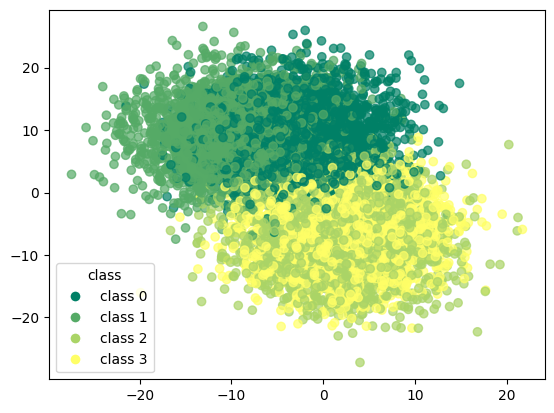

In [92]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

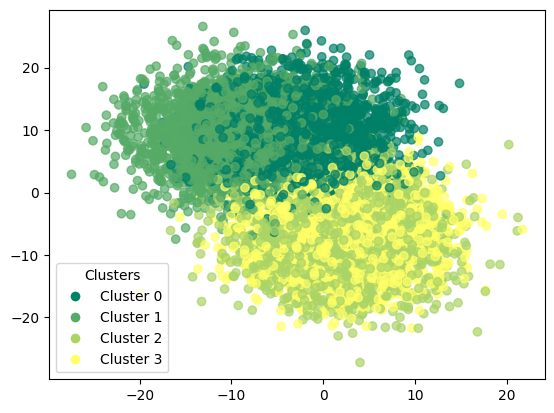

In [93]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

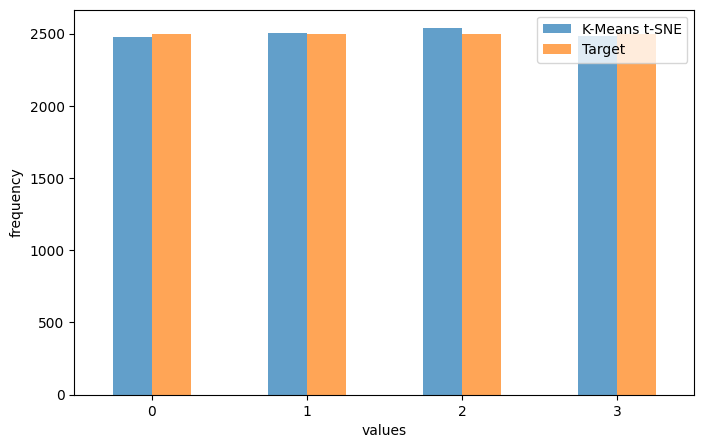

In [94]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [95]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[2298  182   20    0]
 [ 167 2315   18    0]
 [   8    9 2381  102]
 [   0    1  119 2380]]


In [96]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.93      0.92      0.92      2500
           1       0.92      0.93      0.92      2500
           2       0.94      0.95      0.95      2500
           3       0.96      0.95      0.96      2500

    accuracy                           0.94     10000
   macro avg       0.94      0.94      0.94     10000
weighted avg       0.94      0.94      0.94     10000



In [97]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      2500
           1       0.91      0.91      0.91      2500
           2       0.91      0.91      0.91      2500
           3       0.92      0.92      0.92      2500

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000



In [98]:
print(classification_report(df_linear['target'],df_linear['k_means']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      2500
           1       0.94      0.94      0.94      2500
           2       0.96      0.96      0.96      2500
           3       0.97      0.97      0.97      2500

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000



t-sne with kmeans perform better than pca with kmeans

# moons - non linear dataset 

In [99]:
X,y = make_moons(n_samples=10000,noise=0.1,random_state=42)

num_extra_features = 8
extra_features = np.random.normal(scale=0.1,size=(X.shape[0],num_extra_features))  
X_extended = np.hstack((X,extra_features))

df_moons = pd.DataFrame(X_extended,columns=[f"vab_{i+1}" for i in range(X_extended.shape[1])])
df_moons["target"] = y

In [100]:
df_moons

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0


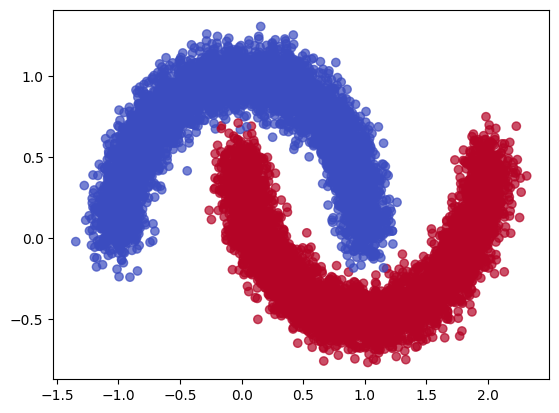

In [101]:
plt.scatter(df_moons.iloc[:,0],df_moons.iloc[:, 1],c=y,cmap='coolwarm',alpha=0.7)
plt.show()

In [102]:
df_moons

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0


### correlation matrix

In [103]:
df_moons.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10
vab_1,1.000000,-0.436503,0.014706,-0.010092,0.009121,-0.004279,-0.013211,-0.003224,0.006794,-0.004280
vab_2,-0.436503,1.000000,-0.001908,0.006302,-0.010323,0.005951,0.009855,-0.002058,-0.013565,0.021388
vab_3,0.014706,-0.001908,1.000000,0.011523,-0.003723,0.002476,0.009739,0.002253,0.000526,-0.012488
vab_4,-0.010092,0.006302,0.011523,1.000000,-0.004380,0.005792,0.002249,0.002227,0.006250,-0.006497
vab_5,0.009121,-0.010323,-0.003723,-0.004380,1.000000,-0.002172,0.005580,0.008400,-0.011090,-0.011749
vab_6,-0.004279,0.005951,0.002476,0.005792,-0.002172,1.000000,-0.004301,-0.001587,-0.002187,0.016021
vab_7,-0.013211,0.009855,0.009739,0.002249,0.005580,-0.004301,1.000000,0.015318,-0.020597,0.015440
vab_8,-0.003224,-0.002058,0.002253,0.002227,0.008400,-0.001587,0.015318,1.000000,-0.001640,0.010650
vab_9,0.006794,-0.013565,0.000526,0.006250,-0.011090,-0.002187,-0.020597,-0.001640,1.000000,0.021581
vab_10,-0.004280,0.021388,-0.012488,-0.006497,-0.011749,0.016021,0.015440,0.010650,0.021581,1.000000


<Axes: >

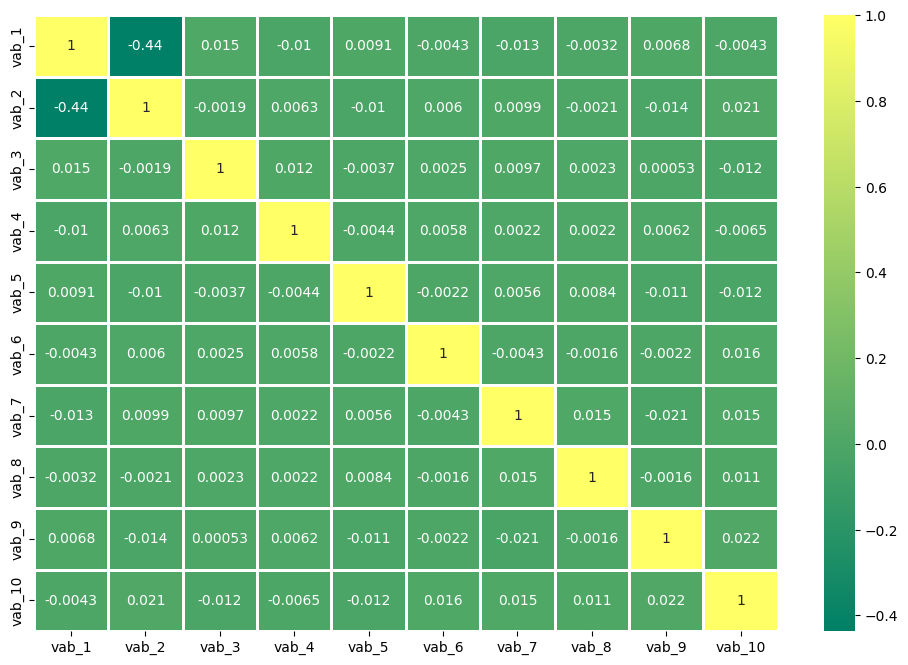

In [104]:
plt.figure(figsize=(12,8))
sns.heatmap(df_moons.iloc[:,:-1].corr(),cmap='summer',annot=True,linecolor='white',linewidths=1)

### data standardization

In [105]:
X_values = df_moons.iloc[:,:-1].values

In [106]:
y_values = df_moons.iloc[:,-1].values

In [107]:
from sklearn.preprocessing import StandardScaler

In [108]:
scaler = StandardScaler()

In [109]:
X_values = scaler.fit_transform(X_values)

In [110]:
np.mean(X_values),np.std(X_values)

(5.2295945351943375e-17, 0.9999999999999992)

In [111]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9
0,-0.052391,-0.745451,-0.736316,1.012151,0.762837,-0.331439,0.130443,-0.415908,-0.379989,-0.652923
1,-1.383186,-0.413818,-1.489276,0.503177,-1.364505,0.003162,-0.560231,1.470742,0.598472,-0.608860
2,-0.100236,1.077265,0.116208,-1.611535,-0.531051,-0.750150,1.053340,-0.889241,-0.319608,0.818084
3,-1.566596,-0.220089,-0.476409,0.144949,0.865101,-0.254805,-0.629568,0.732901,0.035415,-0.183940
4,-1.649469,0.218309,0.142167,-0.184635,-2.336636,-0.802020,0.311396,-1.623226,-0.124259,1.327143
...,...,...,...,...,...,...,...,...,...,...
9995,-0.368628,-0.220491,-0.870293,0.066495,0.404024,0.542017,-0.400792,-0.238949,-0.731574,-1.011532
9996,-0.514868,0.446451,-0.921708,-0.405013,0.627244,-0.388734,-1.522442,-0.369142,-0.937450,-0.073661
9997,-0.618722,-0.008052,0.195598,-0.074317,-0.967357,-1.384359,-0.436026,0.170376,1.963734,0.043726
9998,0.423039,0.544407,-1.246888,-0.689405,0.383700,1.352633,-0.421298,-0.313819,0.987856,1.763626


## pca application

In [112]:
from sklearn.decomposition import PCA

In [113]:
pca_general = PCA()

In [114]:
pca_general.fit(X_values)

PCA()

In [115]:
explained_variance = pca_general.explained_variance_ratio_

In [116]:
explained_variance

array([0.14395403, 0.10361933, 0.10278708, 0.10177264, 0.10016435,
       0.09965399, 0.09851569, 0.0980177 , 0.09523371, 0.05628149])

In [117]:
eigenvalues = pca_general.explained_variance_

In [118]:
pd.DataFrame(eigenvalues)

,0
0,1.439684
1,1.036297
2,1.027974
3,1.017828
4,1.001744
5,0.996640
6,0.985255
7,0.980275
8,0.952432
9,0.562871


In [119]:
eigenvectors = pca_general.components_

### scree plot

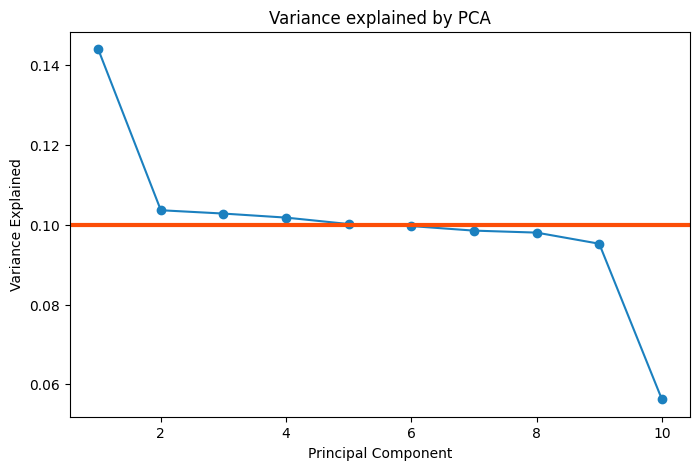

In [120]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [121]:
pca = PCA(n_components=2)

In [122]:
principal_components = pca.fit_transform(X_values)

In [123]:
pd.DataFrame(principal_components).head(8)

,0,1
0,-0.486105,-0.743979
1,0.715157,0.894683
2,0.872126,-0.056163
3,0.902026,-0.299299
4,1.432527,1.440746
5,-0.617331,-0.595673
6,-0.314896,0.804725
7,0.649090,-1.439884


In [124]:
principal_df = pd.DataFrame(data=principal_components,columns=['principal component 1','principal component 2'])

In [125]:
final_df = pd.concat([principal_df,df_moons[['target']]],axis=1)

In [126]:
final_df

,principal component 1,principal component 2,target
0,-0.486105,-0.743979,1
1,0.715157,0.894683,0
2,0.872126,-0.056163,0
3,0.902026,-0.299299,0
4,1.432527,1.440746,0
...,...,...,...
9995,0.088719,-0.593459,1
9996,0.629925,-0.162977,1
9997,0.352146,1.386737,1
9998,0.140342,1.978012,0


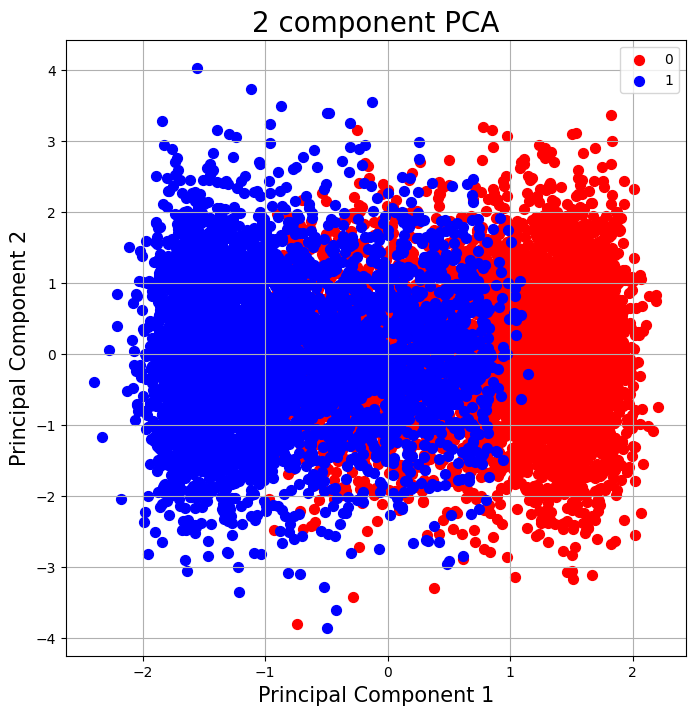

In [127]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1]
colors = ['r','b']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### biplot

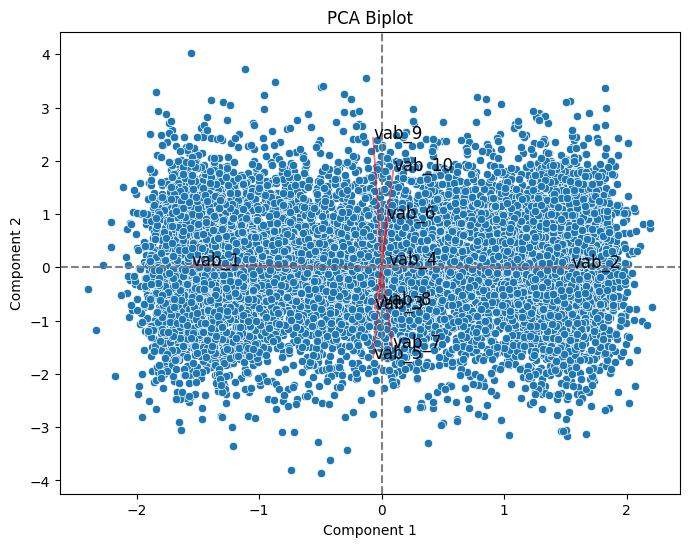

In [128]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(df_moons.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

### loading plot

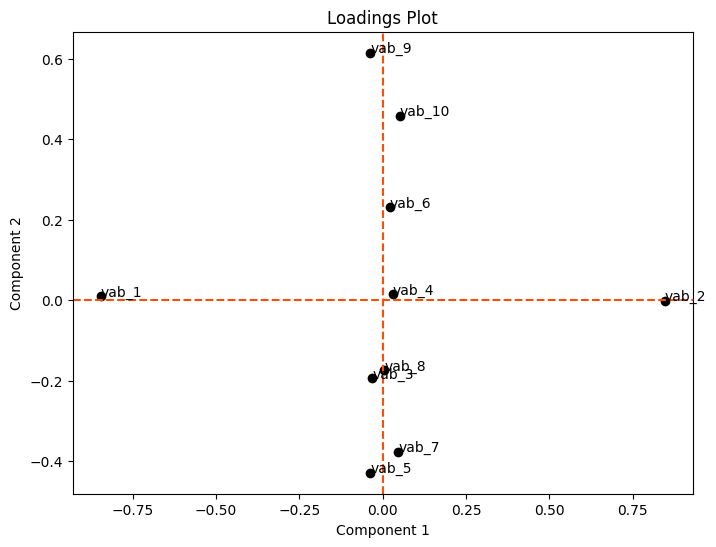

In [129]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(df_moons.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

### scores

In [130]:
scores_pca = pca.transform(X_values)

In [131]:
pd.DataFrame(scores_pca).head()

,0,1
0,-0.486105,-0.743979
1,0.715157,0.894683
2,0.872126,-0.056163
3,0.902026,-0.299299
4,1.432527,1.440746


## t-SNE

In [132]:
tsne = TSNE(n_components=2,random_state=42)

In [133]:
X_tsne = tsne.fit_transform(X_values)

In [134]:
tsne_data = np.vstack((X_tsne.T,df_moons['target'])).T

In [135]:
tsne_df = pd.DataFrame(data=tsne_data,columns=('dim_1','dim_2','target'))

In [136]:
tsne_df

,dim_1,dim_2,target
0,-7.554842,-15.477780,1.0
1,2.943388,10.317172,0.0
2,15.984572,19.490921,0.0
3,57.567825,-14.853810,0.0
4,72.666512,21.975018,0.0
...,...,...,...
9995,-3.297944,-12.430346,1.0
9996,12.583888,-18.312521,1.0
9997,-13.435938,11.732612,1.0
9998,19.991709,33.753979,0.0


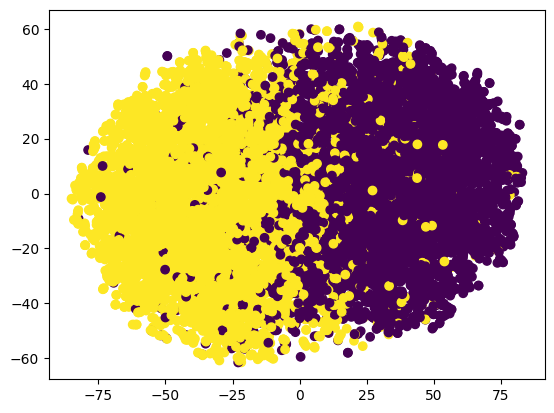

In [137]:
plt.scatter(x=tsne_df['dim_1'],y=tsne_df['dim_2'],c=tsne_df['target'])
plt.show()

In [138]:
tsne.kl_divergence_

3.2419066429138184

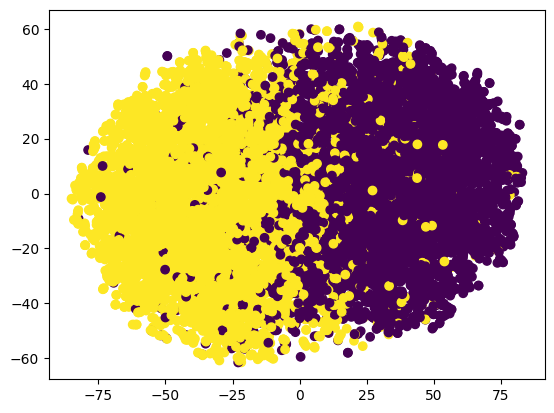

In [139]:
plt.scatter(x=X_tsne[:,0],y=X_tsne[:,1],c=y)
plt.show()

## clustering 

In [140]:
from sklearn.cluster import KMeans

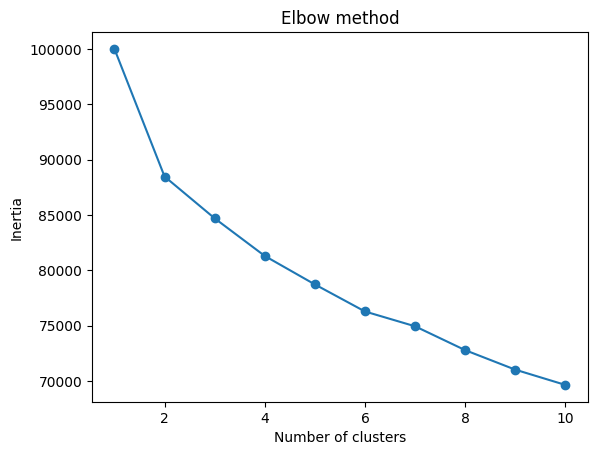

In [141]:
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_values)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [142]:
kmeans = KMeans(n_clusters=2,init='k-means++',random_state=42)

In [143]:
kmeans.fit(X_values)

KMeans(n_clusters=2, random_state=42)

In [144]:
df_moons['k_means'] = kmeans.labels_

In [145]:
df_moons

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1,0
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1,0
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1,0
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0,0


In [146]:
from scipy.optimize import linear_sum_assignment

y_true = df_moons['target'].values  
y_kmeans = df_moons['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_moons['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_moons['k_means'] == y_true))

accuracy before: 0.8501
accuracy after: 0.8501


In [147]:
df_moons

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1,0
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1,0
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1,0
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0,0


In [148]:
print(np.unique(df_moons['target']))

[0 1]


In [149]:
print(np.unique(kmeans.labels_))

[0 1]


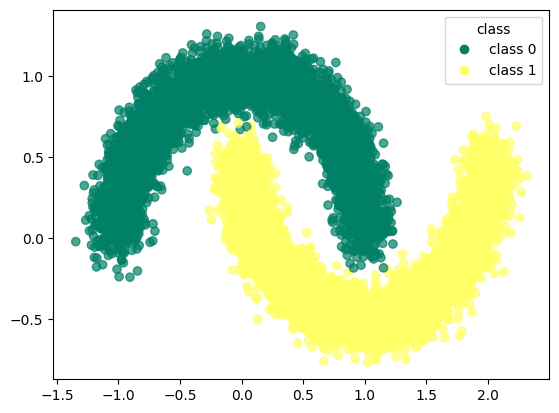

In [150]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_moons.iloc[:, 0], df_moons.iloc[:, 1], 
                      c=df_moons['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_moons['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                        for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

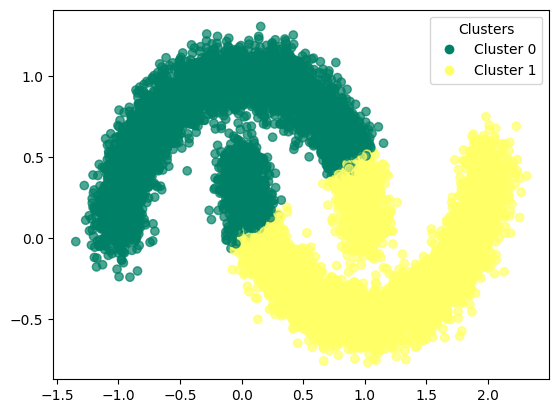

In [151]:
scatter = plt.scatter(df_moons.iloc[:, 0], df_moons.iloc[:, 1], 
                      c=df_moons['k_means'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_moons['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [152]:
kmeans.cluster_centers_

array([[-7.35894749e-01,  7.84595096e-01, -1.17721705e-02,
        -2.92058962e-04, -2.01790137e-02,  8.43782623e-03,
         1.49542768e-02, -4.54533103e-03, -1.01620597e-02,
         3.71829457e-02],
       [ 7.31200046e-01, -7.79589704e-01,  1.16970689e-02,
         2.90195747e-04,  2.00502799e-02, -8.38399640e-03,
        -1.48588747e-02,  4.51633370e-03,  1.00972300e-02,
        -3.69457339e-02]])

In [153]:
print(confusion_matrix(df_moons['target'],df_moons['k_means']))

[[4242  758]
 [ 741 4259]]


In [154]:
print(classification_report(df_moons['target'],df_moons['k_means']))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      5000
           1       0.85      0.85      0.85      5000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



### clustering with pca

In [155]:
WCSS = []

for i in range(1,30):
  kmeans_pca = KMeans(n_clusters = i, init = "k-means++")
  kmeans_pca.fit(scores_pca)
  WCSS.append(kmeans_pca.inertia_)

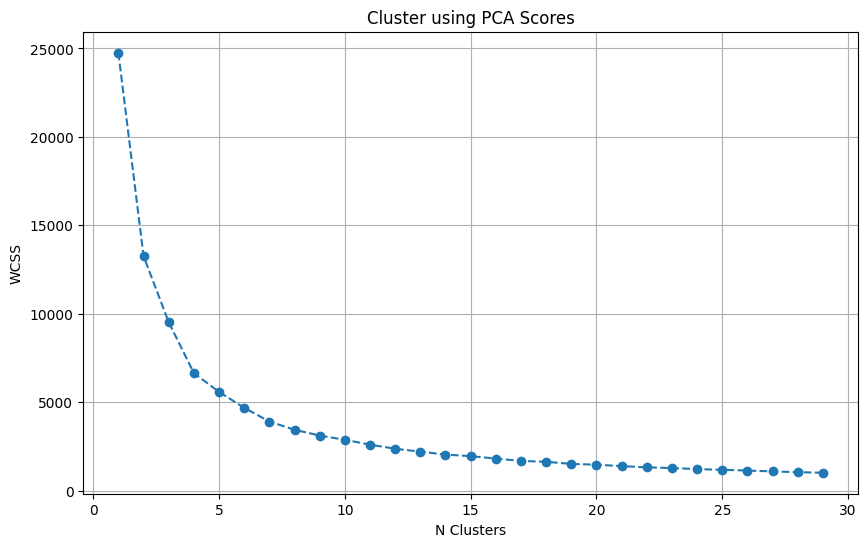

In [156]:
plt.figure(figsize = (10,6))
plt.plot(range(1,30), WCSS, marker = "o", linestyle = "--")
plt.grid()
plt.title("Cluster using PCA Scores")
plt.ylabel("WCSS")
plt.xlabel("N Clusters")
plt.show()

In [157]:
kmeans_pca = KMeans(n_clusters=2,init='k-means++',random_state=42)

In [158]:
kmeans_pca.fit(scores_pca)

KMeans(n_clusters=2, random_state=42)

In [159]:
df_pca_kmeans = df_moons.copy()

In [160]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [161]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_pca
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1,1,0
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0,0,1
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0,0,1
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0,0,1
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1,0,1
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1,0,1
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1,0,1
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0,0,1


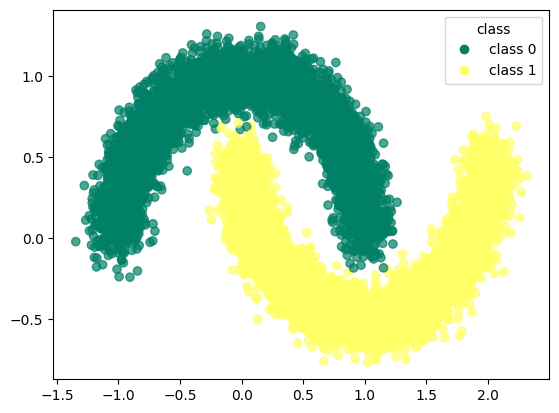

In [162]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

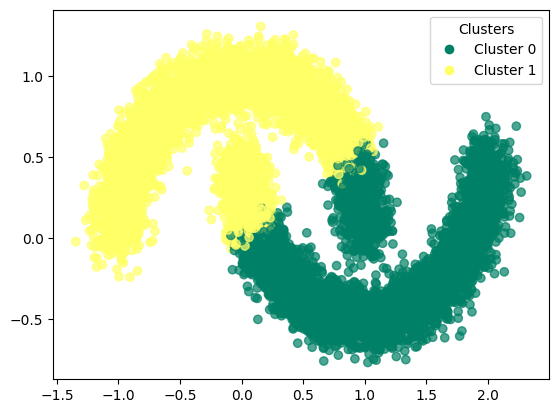

In [163]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [164]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.1532
accuracy after: 0.8468


In [165]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_pca
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1,1,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0,0,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0,0,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0,0,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1,0,0
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1,0,0
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1,0,0
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0,0,0


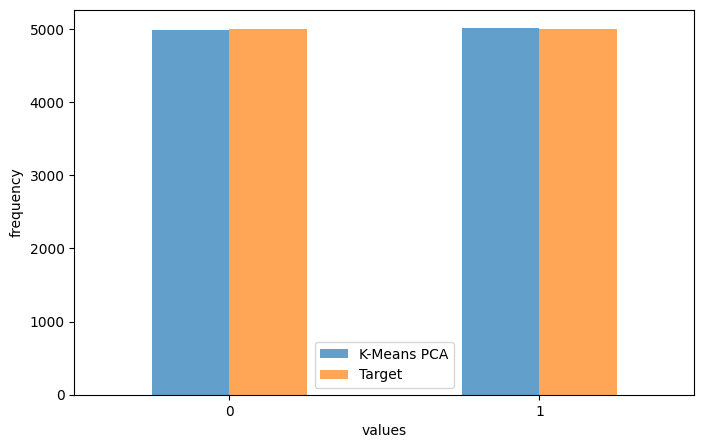

In [166]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [167]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[4229  771]
 [ 761 4239]]


In [168]:
print(classification_report(df_moons['target'],df_moons['k_means']))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      5000
           1       0.85      0.85      0.85      5000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



In [169]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      5000
           1       0.85      0.85      0.85      5000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



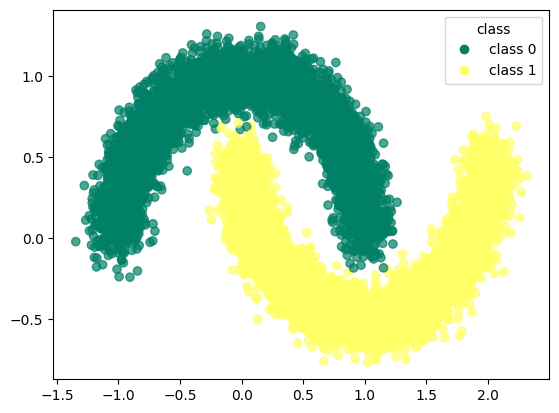

In [170]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

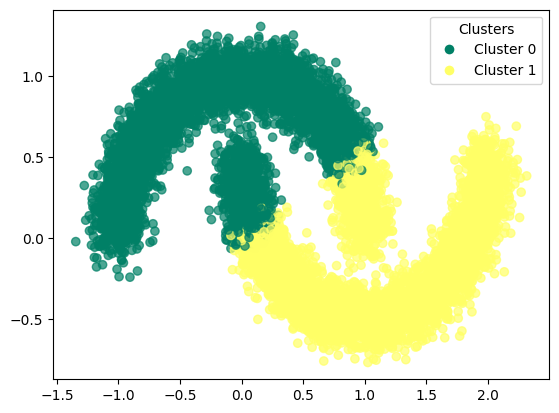

In [171]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

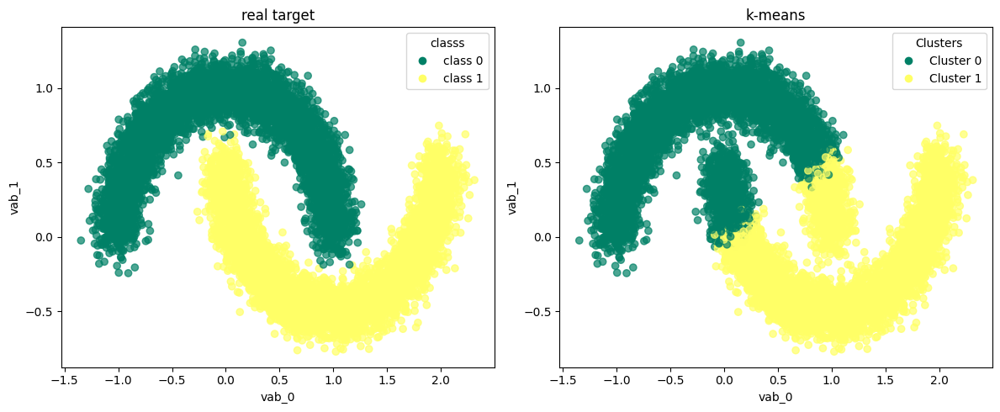

In [172]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

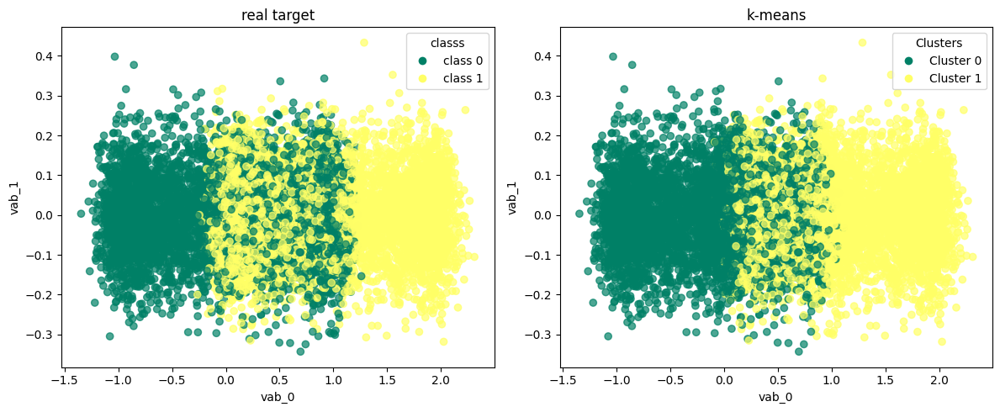

In [173]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

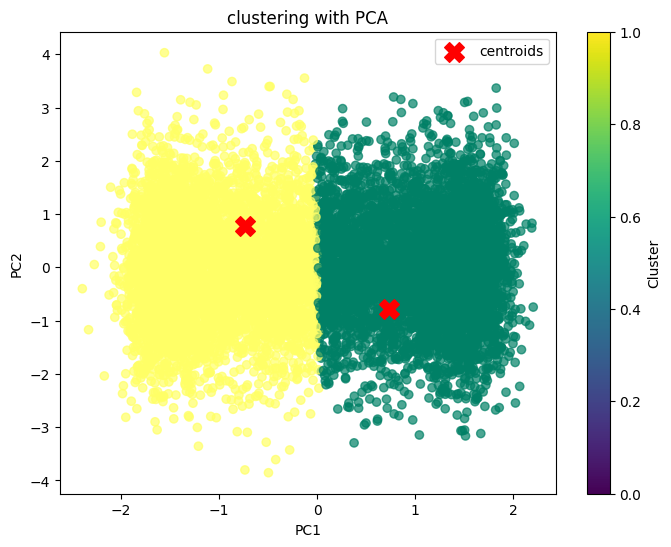

In [174]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

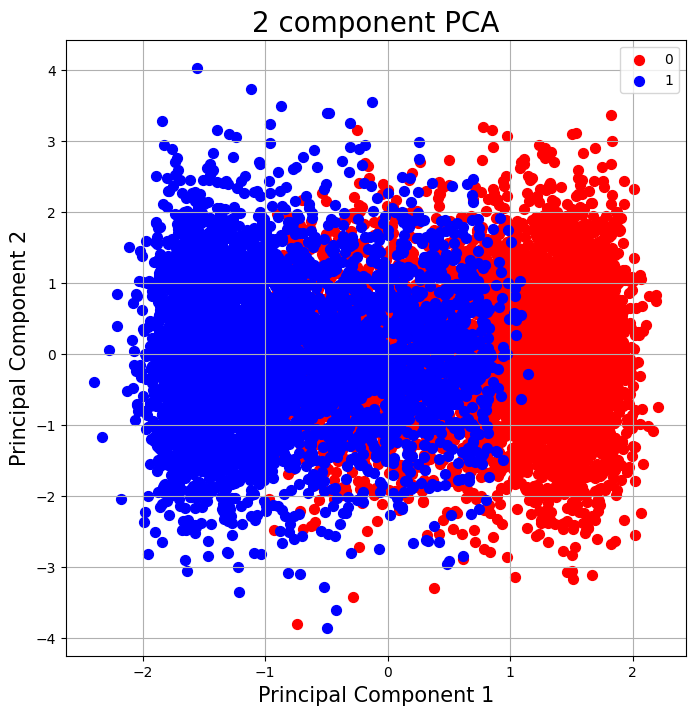

In [175]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1]
colors = ['r','b']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### clustering with t-SNE

In [176]:
kmeans_tsne = KMeans(n_clusters=2,init='k-means++',random_state=42)

In [177]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=2, random_state=42)

In [178]:
df_tsne_kmeans = df_moons.copy()

In [179]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [180]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_tsne
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1,1,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0,0,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0,0,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0,0,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1,0,1
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1,0,0
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1,0,1
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0,0,0


In [181]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.8991
accuracy after: 0.8991


In [182]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,target,k_means,kmeans_tsne
0,0.455493,-0.125503,-0.073413,0.102474,0.075873,-0.030764,0.013079,-0.040026,-0.037460,-0.064250,1,1,1
1,-0.704217,0.041308,-0.148913,0.051353,-0.137602,0.002349,-0.055845,0.147251,0.061028,-0.059872,0,0,0
2,0.413799,0.791322,0.012071,-0.161049,-0.053966,-0.072200,0.105177,-0.087010,-0.031383,0.081916,0,0,0
3,-0.864049,0.138754,-0.047352,0.015372,0.086135,-0.023180,-0.062765,0.074010,0.004353,-0.017650,0,0,0
4,-0.936268,0.359267,0.014674,-0.017731,-0.235153,-0.077333,0.031137,-0.159869,-0.011719,0.132499,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.179911,0.138552,-0.086847,0.007492,0.039867,0.055675,-0.039934,-0.022460,-0.072849,-0.099883,1,0,1
9996,0.052471,0.474023,-0.092002,-0.039866,0.062267,-0.036434,-0.151867,-0.035383,-0.093572,-0.006692,1,0,0
9997,-0.038031,0.245408,0.020031,-0.006651,-0.097749,-0.134962,-0.043450,0.018171,0.198450,0.004972,1,0,1
9998,0.869802,0.523295,-0.124609,-0.068430,0.037827,0.135894,-0.041981,-0.029892,0.100222,0.175870,0,0,0


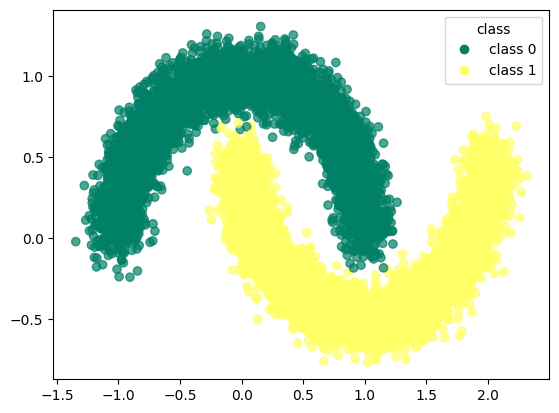

In [183]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

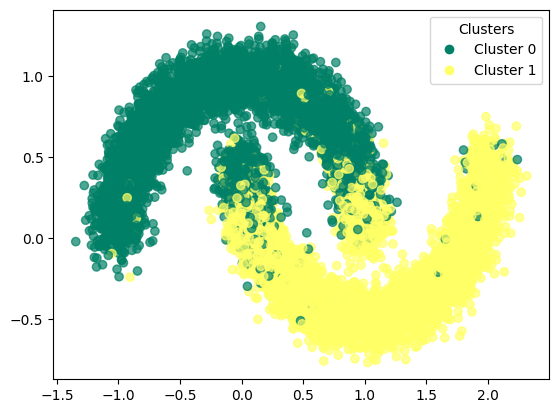

In [184]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

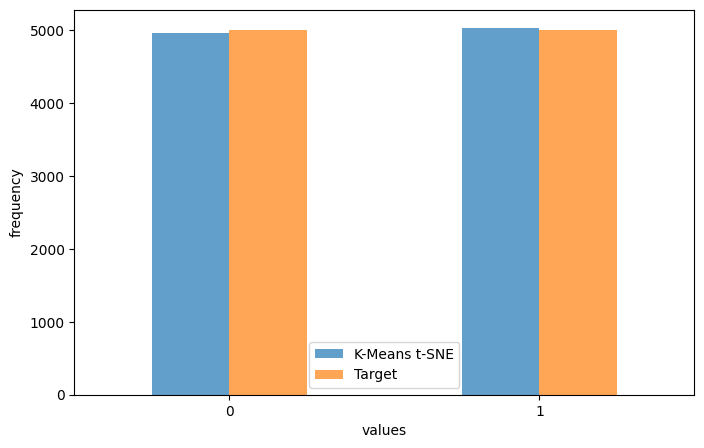

In [185]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar',figsize=(8, 5),alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [186]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[4480  520]
 [ 489 4511]]


In [187]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.90      0.90      0.90      5000
           1       0.90      0.90      0.90      5000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



In [188]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      5000
           1       0.85      0.85      0.85      5000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



In [189]:
print(classification_report(df_moons['target'],df_moons['k_means']))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      5000
           1       0.85      0.85      0.85      5000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



# circle - non linear dataset 

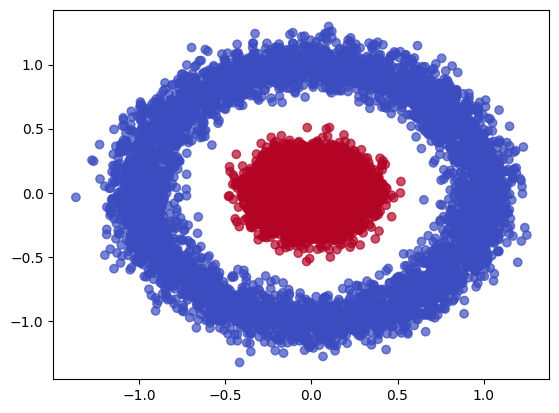

In [284]:
X, y = make_circles(n_samples=10000, noise=0.1, factor=0.2, random_state=42)

num_extra_features = 8
extra_features = np.random.normal(scale=0.1, size=(X.shape[0], num_extra_features))
X_extended = np.hstack((X, extra_features))

plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.show()

In [285]:
df_circles = pd.DataFrame(X_extended, columns=[f"Feature_{i+1}" for i in range(X_extended.shape[1])])
df_circles["target"] = y

In [286]:
df_circles

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0


### correlation matrix

In [287]:
df_circles.iloc[:,:-1].corr()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10
Feature_1,1.000000,0.001393,0.022580,0.001003,-0.018082,-0.011407,0.007801,-0.005300,0.012985,-0.004551
Feature_2,0.001393,1.000000,-0.000806,0.017088,0.000188,0.020699,0.003803,0.007357,0.006386,-0.026519
Feature_3,0.022580,-0.000806,1.000000,0.006536,0.003324,-0.000860,0.006982,-0.001933,0.011470,0.004375
Feature_4,0.001003,0.017088,0.006536,1.000000,-0.008750,-0.009000,0.000818,-0.011846,0.001492,-0.003121
Feature_5,-0.018082,0.000188,0.003324,-0.008750,1.000000,0.016541,-0.002767,0.025910,0.014185,-0.009160
Feature_6,-0.011407,0.020699,-0.000860,-0.009000,0.016541,1.000000,0.011298,-0.008635,-0.014979,0.003218
Feature_7,0.007801,0.003803,0.006982,0.000818,-0.002767,0.011298,1.000000,0.007153,-0.009447,-0.018129
Feature_8,-0.005300,0.007357,-0.001933,-0.011846,0.025910,-0.008635,0.007153,1.000000,-0.002528,0.003355
Feature_9,0.012985,0.006386,0.011470,0.001492,0.014185,-0.014979,-0.009447,-0.002528,1.000000,-0.013369
Feature_10,-0.004551,-0.026519,0.004375,-0.003121,-0.009160,0.003218,-0.018129,0.003355,-0.013369,1.000000


<Axes: >

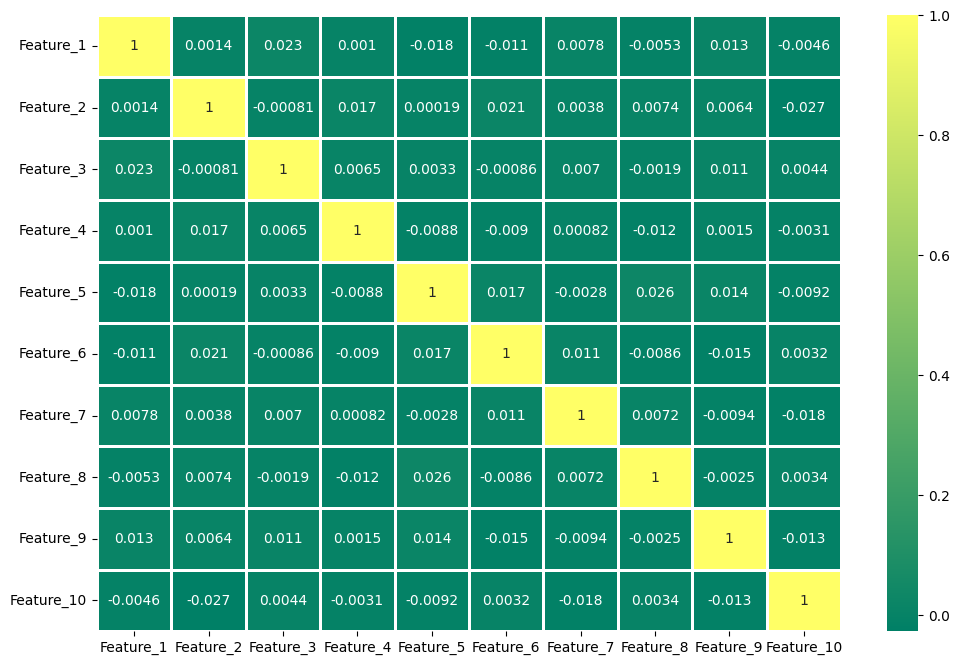

In [288]:
plt.figure(figsize=(12,8))
sns.heatmap(df_circles.iloc[:,:-1].corr(),cmap='summer',annot=True,linecolor='white',linewidths=1)

### data standardization

In [289]:
X_values = df_circles.iloc[:,:-1].values

In [290]:
y_values = df_circles.iloc[:,-1].values

In [291]:
from sklearn.preprocessing import StandardScaler

In [292]:
scaler = StandardScaler()

In [293]:
X_values = scaler.fit_transform(X_values)

In [294]:
np.mean(X_values),np.std(X_values)

(-1.1510792319313622e-17, 1.0000000000000009)

In [295]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9
0,0.309049,0.544134,-0.260872,0.969431,-0.416015,0.004562,-0.041544,0.211212,2.118484,0.071630
1,2.313386,-1.040751,-0.644229,-0.264708,-0.540159,-0.369227,-0.432516,0.367015,-0.032995,-1.555886
2,-1.198062,1.401072,-2.306372,-0.263039,-2.668480,-0.479767,0.349315,1.295610,1.041671,0.275836
3,2.066837,-0.653542,0.051097,1.119056,0.327309,-0.907937,-0.692102,0.199804,2.278849,-0.194856
4,1.626991,-0.965343,-0.044565,-0.956494,-0.160910,0.190105,1.167806,-1.396382,0.657352,1.533913
...,...,...,...,...,...,...,...,...,...,...
9995,0.376839,0.468127,1.648879,-0.496679,0.385145,0.631903,-0.609411,0.401719,-0.785357,-0.693819
9996,0.460620,0.272608,-0.130718,2.304617,0.271242,0.915557,-1.289294,1.170761,1.281491,0.811715
9997,0.207503,0.159001,-0.365479,-2.199463,-2.251007,0.150395,0.021843,-0.601888,0.087734,-1.239820
9998,0.931093,1.713429,1.121027,0.193728,0.724273,-2.025359,-0.135496,-1.443359,-0.423483,0.045305


## pca application

In [296]:
from sklearn.decomposition import PCA

In [297]:
pca_general = PCA()

In [298]:
pca_general.fit(X_values)

PCA()

In [299]:
explained_variance = pca_general.explained_variance_ratio_

In [300]:
explained_variance

array([0.10482865, 0.10457455, 0.10290561, 0.1015137 , 0.10045921,
       0.09972371, 0.09859682, 0.09675785, 0.0963815 , 0.09425839])

In [301]:
eigenvalues = pca_general.explained_variance_

In [302]:
pd.DataFrame(eigenvalues)

,0
0,1.048391
1,1.045850
2,1.029159
3,1.015239
4,1.004693
5,0.997337
6,0.986067
7,0.967675
8,0.963911
9,0.942678


In [303]:
eigenvectors = pca_general.components_

### scree plot

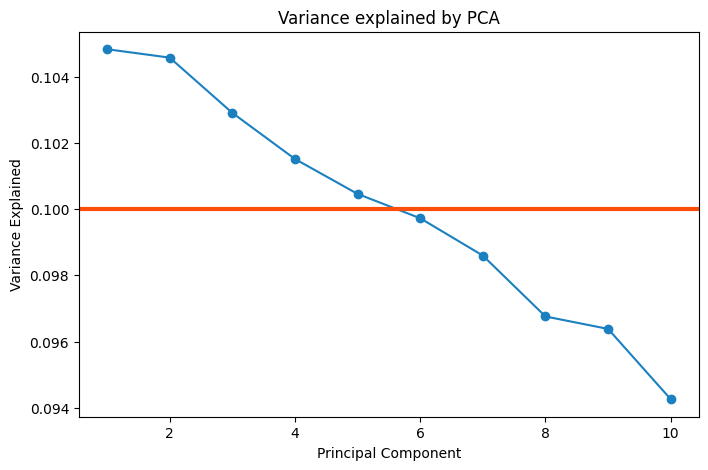

In [304]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [305]:
pca = PCA(n_components=2)

In [306]:
principal_components = pca.fit_transform(X_values)

In [307]:
pd.DataFrame(principal_components).head(8)

,0,1
0,0.804045,-1.039221
1,1.264317,-0.322329
2,-0.307069,0.149619
3,2.033067,-0.805982
4,1.308977,0.820787
5,1.227888,0.179251
6,1.098161,-1.310402
7,1.562719,1.195164


In [308]:
principal_df = pd.DataFrame(data=principal_components,columns=['principal component 1','principal component 2'])

In [309]:
final_df = pd.concat([principal_df,df_circles[['target']]],axis=1)

In [310]:
final_df

,principal component 1,principal component 2,target
0,0.804045,-1.039221,1
1,1.264317,-0.322329,0
2,-0.307069,0.149619,0
3,2.033067,-0.805982,0
4,1.308977,0.820787,0
...,...,...,...
9995,-0.240158,-0.704085,1
9996,0.188798,-0.480918,1
9997,0.626857,0.073266,1
9998,1.535065,-0.953126,0


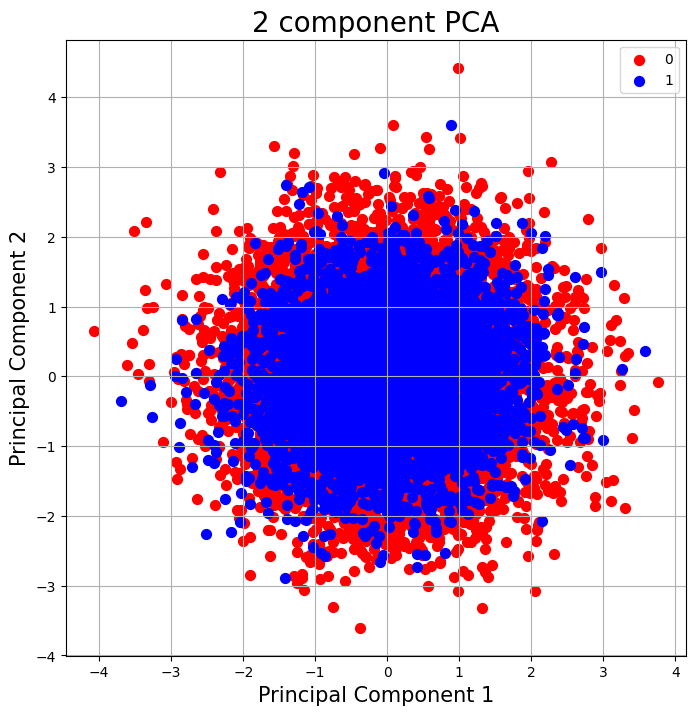

In [311]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1]
colors = ['r','b']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### biplot

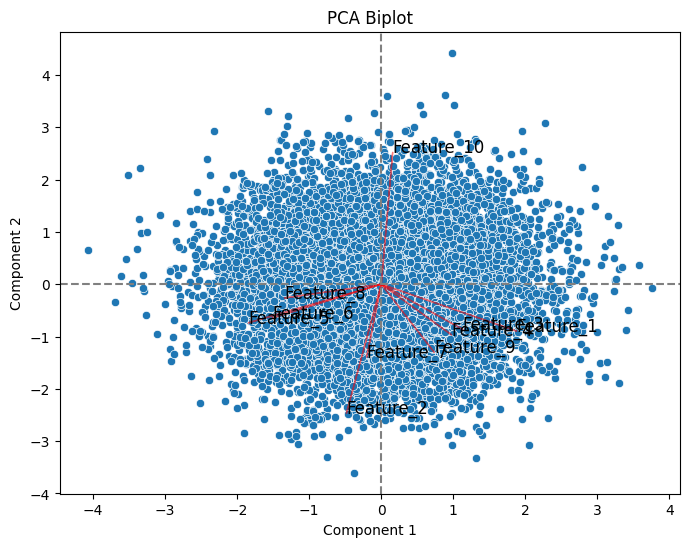

In [312]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(df_circles.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

### loading plot

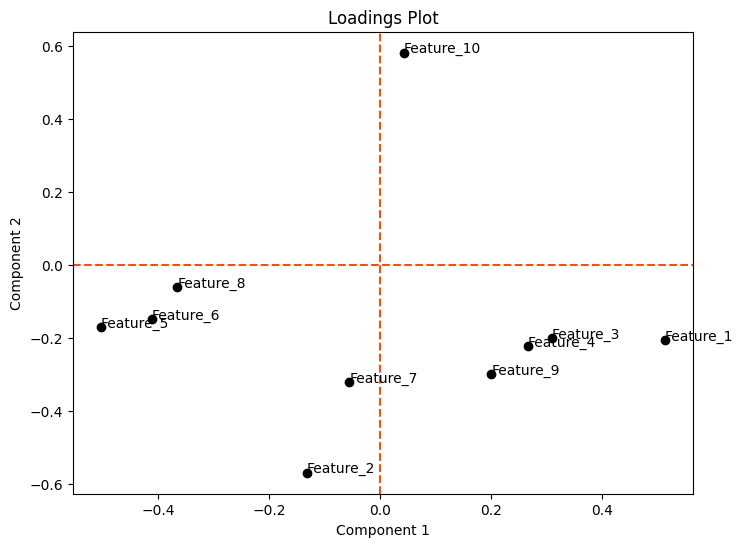

In [313]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(df_circles.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

### scores

In [314]:
scores_pca = pca.transform(X_values)

In [315]:
pd.DataFrame(scores_pca).head()

,0,1
0,0.804045,-1.039221
1,1.264317,-0.322329
2,-0.307069,0.149619
3,2.033067,-0.805982
4,1.308977,0.820787


## t-SNE

In [316]:
tsne = TSNE(n_components=2,random_state=42)

In [317]:
X_tsne = tsne.fit_transform(X_values)

In [318]:
tsne_data = np.vstack((X_tsne.T,df_circles['target'])).T

In [319]:
tsne_df = pd.DataFrame(data=tsne_data,columns=('dim_1','dim_2','target'))

In [320]:
tsne_df

,dim_1,dim_2,target
0,-5.927684,-15.156049,1.0
1,80.337151,-3.990625,0.0
2,-56.762112,-45.600533,0.0
3,72.041687,-30.501837,0.0
4,62.652184,25.286453,0.0
...,...,...,...
9995,4.593113,11.918267,1.0
9996,-36.303318,21.712233,1.0
9997,46.162605,14.915412,1.0
9998,58.533768,-56.781452,0.0


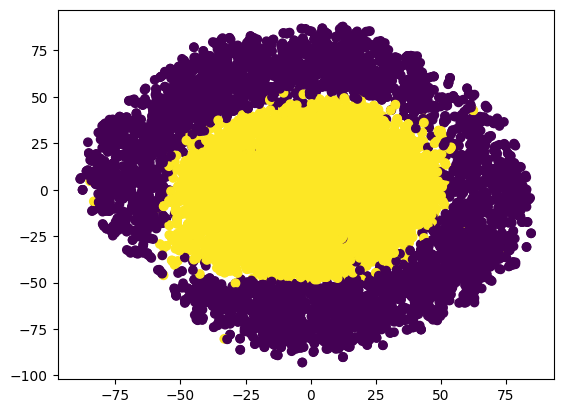

In [321]:
plt.scatter(x=tsne_df['dim_1'],y=tsne_df['dim_2'],c=tsne_df['target'])
plt.show()

In [322]:
tsne.kl_divergence_

3.1144015789031982

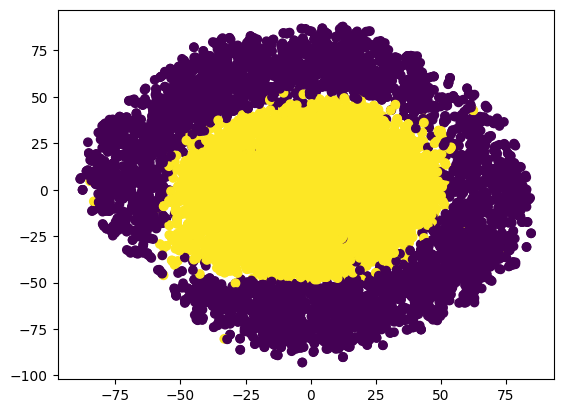

In [323]:
plt.scatter(x=X_tsne[:,0],y=X_tsne[:,1],c=y)
plt.show()

## clustering 

In [324]:
from sklearn.cluster import KMeans

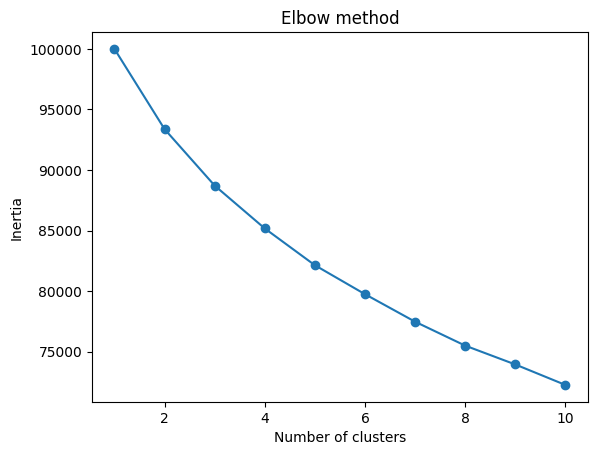

In [325]:
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X_values)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [326]:
kmeans = KMeans(n_clusters=2,init='k-means++',random_state=42)

In [327]:
kmeans.fit(X_values)

KMeans(n_clusters=2, random_state=42)

In [328]:
df_circles['k_means'] = kmeans.labels_

In [329]:
df_circles

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target,k_means
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1,1
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0,1
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0,0
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0,1
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1,0
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1,0
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1,1
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0,1


In [330]:
from scipy.optimize import linear_sum_assignment

y_true = df_circles['target'].values  
y_kmeans = df_circles['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_circles['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_circles['k_means'] == y_true))

accuracy before: 0.4966
accuracy after: 0.5034


In [331]:
df_circles

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target,k_means
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1,0
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0,0
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0,1
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0,0
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1,1
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1,1
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1,0
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0,0


In [332]:
print(np.unique(df_circles['target']))

[0 1]


In [333]:
print(np.unique(kmeans.labels_))

[0 1]


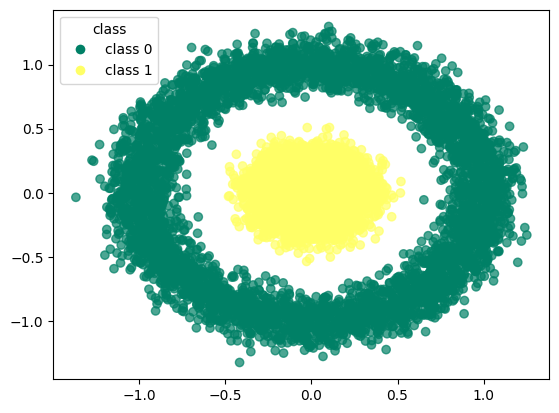

In [334]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_circles.iloc[:, 0], df_circles.iloc[:, 1], 
                      c=df_circles['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_circles['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                        for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

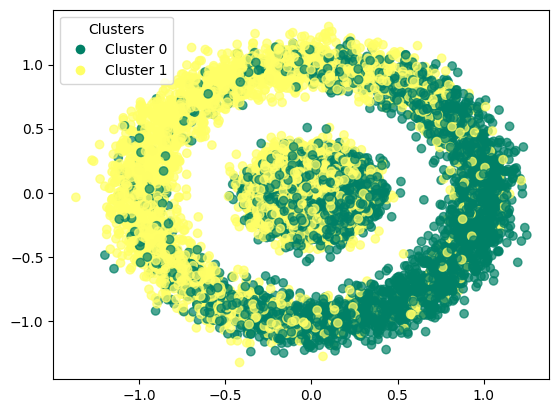

In [335]:
scatter = plt.scatter(df_circles.iloc[:, 0], df_circles.iloc[:, 1], 
                      c=df_circles['k_means'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_circles['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [336]:
kmeans.cluster_centers_

array([[-0.43698252,  0.25240741, -0.22259863,  0.01961309,  0.23625121,
         0.45825867,  0.07149531,  0.04019116, -0.26200753, -0.00474536],
       [ 0.45445469, -0.26249958,  0.23149894, -0.0203973 , -0.2456974 ,
        -0.47658153, -0.07435396, -0.04179815,  0.27248356,  0.0049351 ]])

In [337]:
print(confusion_matrix(df_circles['target'],df_circles['k_means']))

[[2468 2532]
 [2434 2566]]


In [338]:
print(classification_report(df_circles['target'],df_circles['k_means']))

              precision    recall  f1-score   support

           0       0.50      0.49      0.50      5000
           1       0.50      0.51      0.51      5000

    accuracy                           0.50     10000
   macro avg       0.50      0.50      0.50     10000
weighted avg       0.50      0.50      0.50     10000



### clustering with pca

In [339]:
WCSS = []

for i in range(1,30):
  kmeans_pca = KMeans(n_clusters = i, init = "k-means++")
  kmeans_pca.fit(scores_pca)
  WCSS.append(kmeans_pca.inertia_)

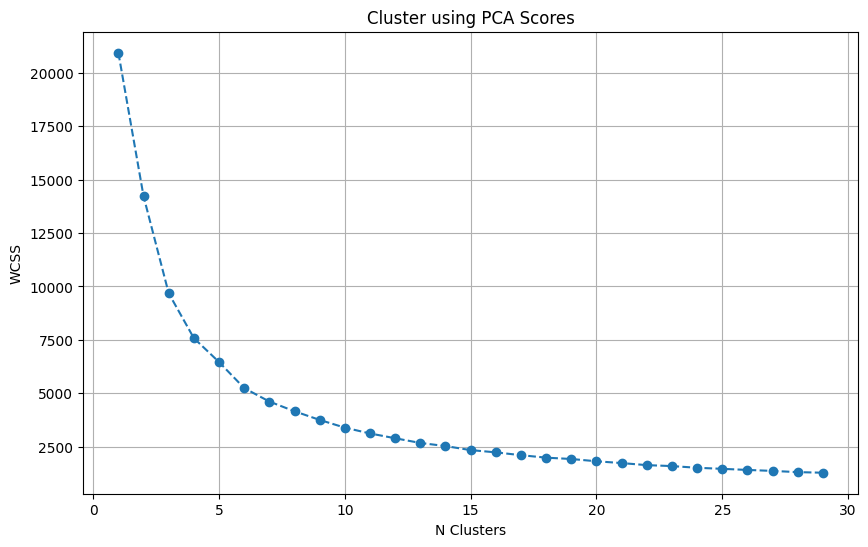

In [340]:
plt.figure(figsize = (10,6))
plt.plot(range(1,30), WCSS, marker = "o", linestyle = "--")
plt.grid()
plt.title("Cluster using PCA Scores")
plt.ylabel("WCSS")
plt.xlabel("N Clusters")
plt.show()

In [341]:
kmeans_pca = KMeans(n_clusters=2,init='k-means++',random_state=42)

In [342]:
kmeans_pca.fit(scores_pca)

KMeans(n_clusters=2, random_state=42)

In [343]:
df_pca_kmeans = df_circles.copy()

In [344]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [345]:
df_pca_kmeans

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target,k_means,kmeans_pca
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1,0,0
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0,0,0
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0,1,1
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0,0,0
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1,1,0
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1,1,0
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1,0,1
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0,0,0


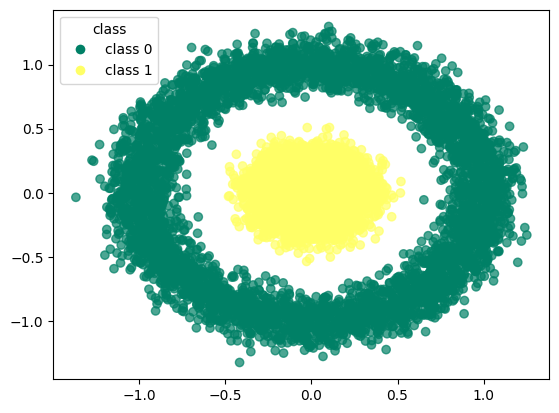

In [346]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

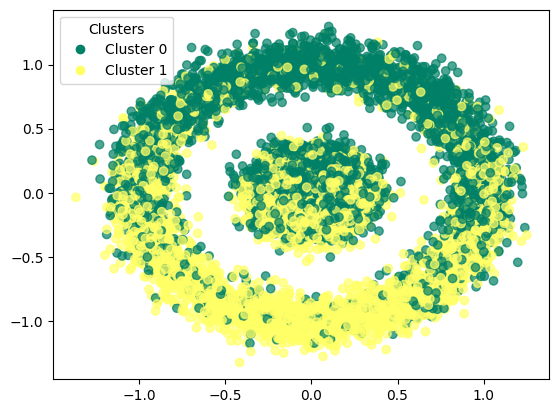

In [347]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [348]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.4928
accuracy after: 0.5072


In [349]:
df_pca_kmeans

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target,k_means,kmeans_pca
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1,0,1
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0,0,1
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0,1,0
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0,0,1
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1,1,1
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1,1,1
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1,0,0
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0,0,1


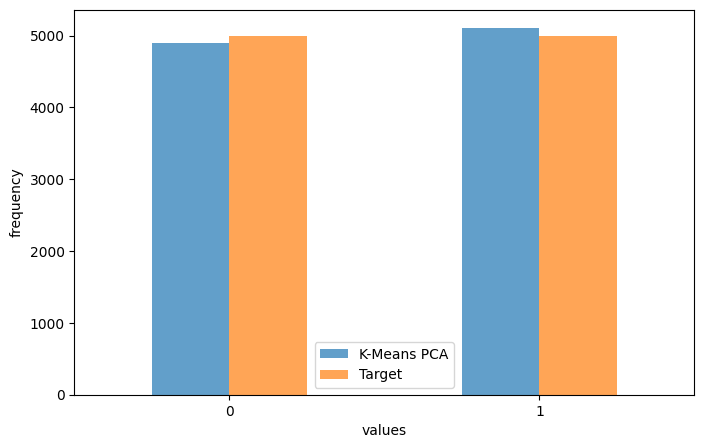

In [350]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [351]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2483 2517]
 [2411 2589]]


In [352]:
print(classification_report(df_circles['target'],df_circles['k_means']))

              precision    recall  f1-score   support

           0       0.50      0.49      0.50      5000
           1       0.50      0.51      0.51      5000

    accuracy                           0.50     10000
   macro avg       0.50      0.50      0.50     10000
weighted avg       0.50      0.50      0.50     10000



In [353]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.51      0.50      0.50      5000
           1       0.51      0.52      0.51      5000

    accuracy                           0.51     10000
   macro avg       0.51      0.51      0.51     10000
weighted avg       0.51      0.51      0.51     10000



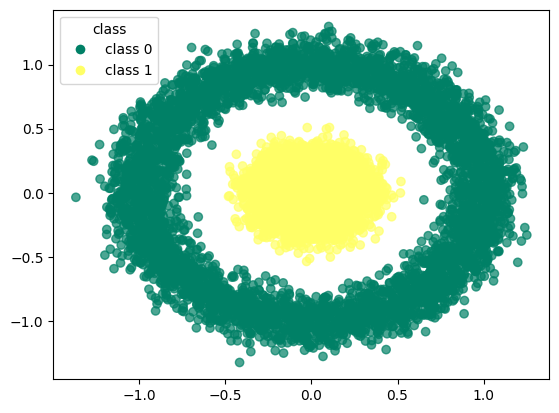

In [354]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

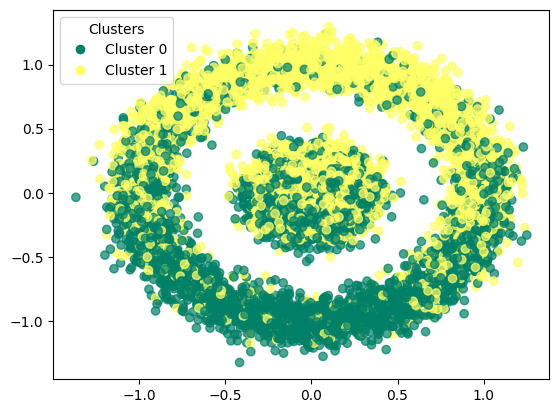

In [355]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

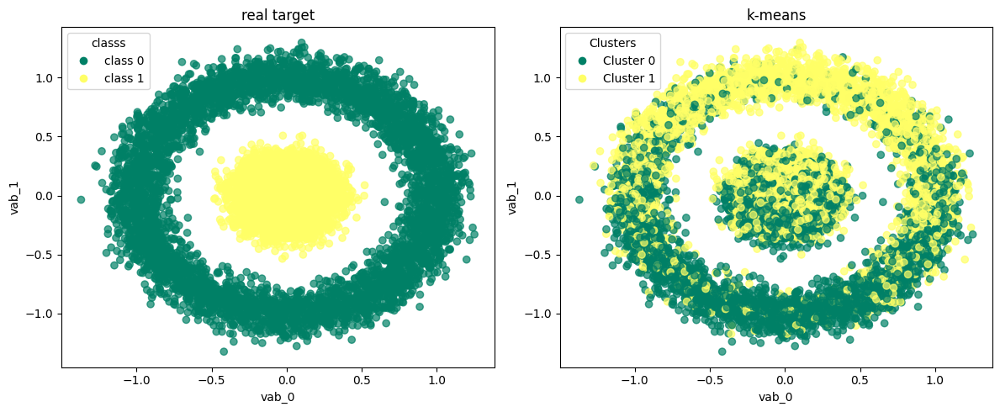

In [356]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

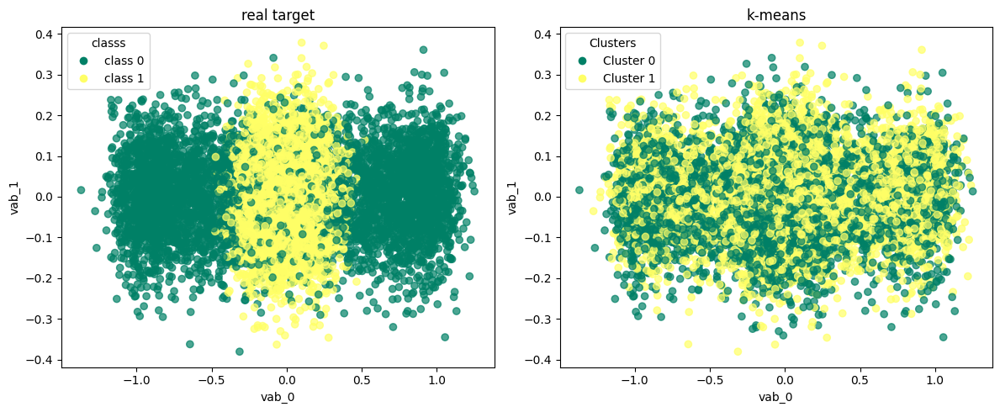

In [357]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

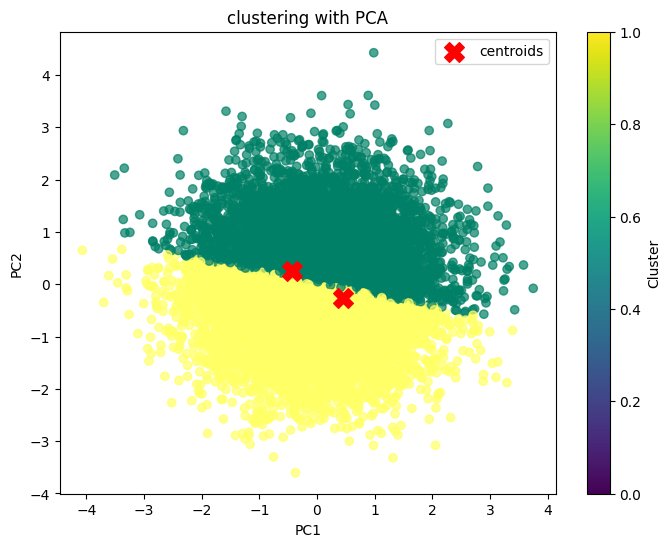

In [358]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

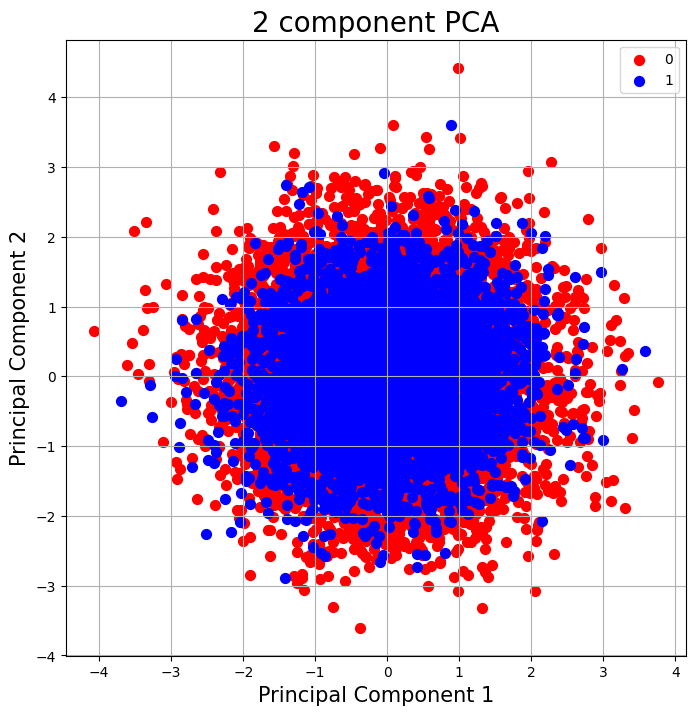

In [359]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1]
colors = ['r','b']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### clustering with t-SNE

In [360]:
kmeans_tsne = KMeans(n_clusters=2,init='k-means++',random_state=42)

In [361]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=2, random_state=42)

In [362]:
df_tsne_kmeans = df_circles.copy()

In [363]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [364]:
df_tsne_kmeans

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target,k_means,kmeans_tsne
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1,0,0
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0,0,0
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0,1,0
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0,0,0
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1,1,1
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1,1,1
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1,0,0
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0,0,0


In [365]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.5026
accuracy after: 0.5026


In [366]:
df_tsne_kmeans

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,target,k_means,kmeans_tsne
0,0.161097,0.282602,-0.024621,0.095248,-0.042426,0.000725,-0.004800,0.021528,0.211604,0.005676,1,0,0
1,1.198440,-0.542104,-0.062714,-0.026242,-0.054809,-0.036249,-0.043834,0.037340,-0.003939,-0.156643,0,0,0
2,-0.618907,0.728517,-0.227873,-0.026078,-0.267110,-0.047183,0.034222,0.131580,0.103725,0.026043,0,1,0
3,1.070839,-0.340617,0.006377,0.109977,0.031721,-0.089536,-0.069750,0.020370,0.227670,-0.020902,0,0,0
4,0.843196,-0.502865,-0.003128,-0.094342,-0.016979,0.019079,0.115938,-0.141621,0.065223,0.151516,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.196181,0.243052,0.165141,-0.049078,0.037491,0.062779,-0.061494,0.040862,-0.079313,-0.070665,1,1,1
9996,0.239543,0.141312,-0.011689,0.226685,0.026129,0.090837,-0.129372,0.118910,0.127751,0.079488,1,1,1
9997,0.108542,0.082195,-0.035016,-0.216702,-0.225467,0.015151,0.001528,-0.060991,0.008157,-0.125121,1,0,0
9998,0.483035,0.891054,0.112691,0.018887,0.071319,-0.200067,-0.014180,-0.146389,-0.043059,0.003051,0,0,0


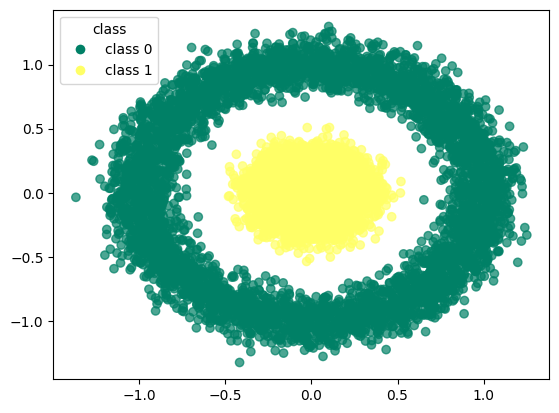

In [367]:
from matplotlib.lines import Line2D

scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

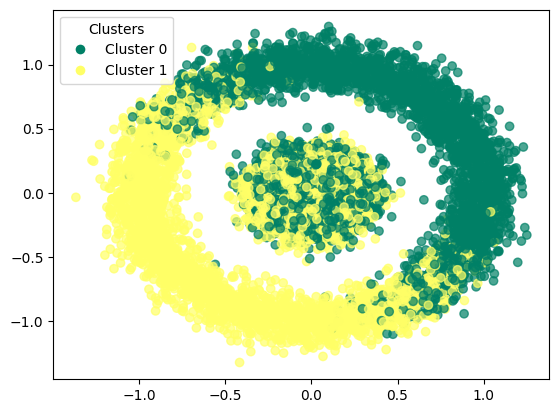

In [ ]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0],df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'],cmap='summer',alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

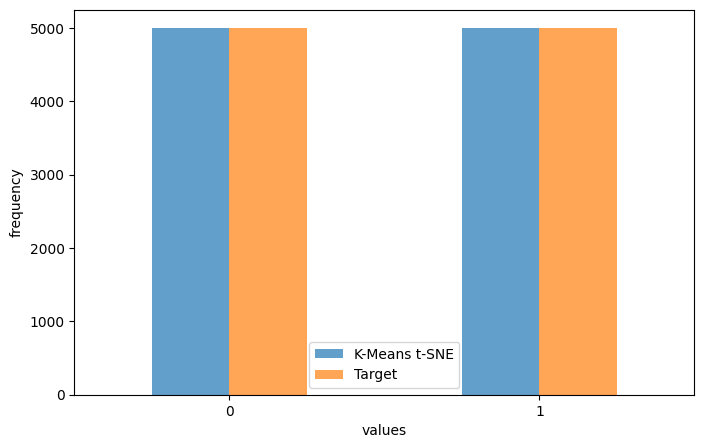

In [369]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar',figsize=(8, 5),alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [370]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[2513 2487]
 [2487 2513]]


In [371]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.50      0.50      0.50      5000
           1       0.50      0.50      0.50      5000

    accuracy                           0.50     10000
   macro avg       0.50      0.50      0.50     10000
weighted avg       0.50      0.50      0.50     10000



In [372]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.51      0.50      0.50      5000
           1       0.51      0.52      0.51      5000

    accuracy                           0.51     10000
   macro avg       0.51      0.51      0.51     10000
weighted avg       0.51      0.51      0.51     10000



In [373]:
print(classification_report(df_circles['target'],df_circles['k_means']))

              precision    recall  f1-score   support

           0       0.50      0.49      0.50      5000
           1       0.50      0.51      0.51      5000

    accuracy                           0.50     10000
   macro avg       0.50      0.50      0.50     10000
weighted avg       0.50      0.50      0.50     10000

